## 1. Preparação dos Dados

### 1.1 Importação dos arquivos

Nesta etapa, vou ler todos os arquivos CSV fornecidos no dataset público da Olist.

Vou usar o **pandas** para a leitura dos arquivos e criar um dicionário `dfs` para armazenar os DataFrames de forma organizada.

In [136]:
import pandas as pd
import duckdb
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score
from scipy.stats import pearsonr
import numpy as np
import os
import warnings
warnings.filterwarnings('ignore')

In [2]:
# Definindo caminho base dos dados
DATA_PATH = 'dados/'

In [3]:
# Dicionário para facilitar o carregamento e visualização
files = {
    "customers": "olist_customers_dataset.csv",
    "geolocation": "olist_geolocation_dataset.csv",
    "order_items": "olist_order_items_dataset.csv",
    "order_payments": "olist_order_payments_dataset.csv",
    "order_reviews": "olist_order_reviews_dataset.csv",
    "orders": "olist_orders_dataset.csv",
    "products": "olist_products_dataset.csv",
    "sellers": "olist_sellers_dataset.csv",
    "category_translation": "product_category_name_translation.csv"
}

In [4]:
# Carregar todos os DataFrames em um dicionário
dfs = {}
for key, file in files.items():
    dfs[key] = pd.read_csv(os.path.join(DATA_PATH, file))

In [5]:
for name, df in dfs.items():
    print(f"\n{name.upper()} - Shape: {df.shape}")
    display(df.head())


CUSTOMERS - Shape: (99441, 5)


,customer_id,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state
0,06b8999e2fba1a1fbc88172c00ba8bc7,861eff4711a542e4b93843c6dd7febb0,14409,franca,SP
1,18955e83d337fd6b2def6b18a428ac77,290c77bc529b7ac935b93aa66c333dc3,9790,sao bernardo do campo,SP
2,4e7b3e00288586ebd08712fdd0374a03,060e732b5b29e8181a18229c7b0b2b5e,1151,sao paulo,SP
3,b2b6027bc5c5109e529d4dc6358b12c3,259dac757896d24d7702b9acbbff3f3c,8775,mogi das cruzes,SP
4,4f2d8ab171c80ec8364f7c12e35b23ad,345ecd01c38d18a9036ed96c73b8d066,13056,campinas,SP



GEOLOCATION - Shape: (1000163, 5)


,geolocation_zip_code_prefix,geolocation_lat,geolocation_lng,geolocation_city,geolocation_state
0,1037,-23.545621,-46.639292,sao paulo,SP
1,1046,-23.546081,-46.644820,sao paulo,SP
2,1046,-23.546129,-46.642951,sao paulo,SP
3,1041,-23.544392,-46.639499,sao paulo,SP
4,1035,-23.541578,-46.641607,sao paulo,SP



ORDER_ITEMS - Shape: (112650, 7)


,order_id,order_item_id,product_id,seller_id,shipping_limit_date,price,freight_value
0,00010242fe8c5a6d1ba2dd792cb16214,1,4244733e06e7ecb4970a6e2683c13e61,48436dade18ac8b2bce089ec2a041202,2017-09-19 09:45:35,58.90,13.29
1,00018f77f2f0320c557190d7a144bdd3,1,e5f2d52b802189ee658865ca93d83a8f,dd7ddc04e1b6c2c614352b383efe2d36,2017-05-03 11:05:13,239.90,19.93
2,000229ec398224ef6ca0657da4fc703e,1,c777355d18b72b67abbeef9df44fd0fd,5b51032eddd242adc84c38acab88f23d,2018-01-18 14:48:30,199.00,17.87
3,00024acbcdf0a6daa1e931b038114c75,1,7634da152a4610f1595efa32f14722fc,9d7a1d34a5052409006425275ba1c2b4,2018-08-15 10:10:18,12.99,12.79
4,00042b26cf59d7ce69dfabb4e55b4fd9,1,ac6c3623068f30de03045865e4e10089,df560393f3a51e74553ab94004ba5c87,2017-02-13 13:57:51,199.90,18.14



ORDER_PAYMENTS - Shape: (103886, 5)


,order_id,payment_sequential,payment_type,payment_installments,payment_value
0,b81ef226f3fe1789b1e8b2acac839d17,1,credit_card,8,99.33
1,a9810da82917af2d9aefd1278f1dcfa0,1,credit_card,1,24.39
2,25e8ea4e93396b6fa0d3dd708e76c1bd,1,credit_card,1,65.71
3,ba78997921bbcdc1373bb41e913ab953,1,credit_card,8,107.78
4,42fdf880ba16b47b59251dd489d4441a,1,credit_card,2,128.45



ORDER_REVIEWS - Shape: (99224, 7)


,review_id,order_id,review_score,review_comment_title,review_comment_message,review_creation_date,review_answer_timestamp
0,7bc2406110b926393aa56f80a40eba40,73fc7af87114b39712e6da79b0a377eb,4,NaN,NaN,2018-01-18 00:00:00,2018-01-18 21:46:59
1,80e641a11e56f04c1ad469d5645fdfde,a548910a1c6147796b98fdf73dbeba33,5,NaN,NaN,2018-03-10 00:00:00,2018-03-11 03:05:13
2,228ce5500dc1d8e020d8d1322874b6f0,f9e4b658b201a9f2ecdecbb34bed034b,5,NaN,NaN,2018-02-17 00:00:00,2018-02-18 14:36:24
3,e64fb393e7b32834bb789ff8bb30750e,658677c97b385a9be170737859d3511b,5,NaN,Recebi bem antes do prazo estipulado.,2017-04-21 00:00:00,2017-04-21 22:02:06
4,f7c4243c7fe1938f181bec41a392bdeb,8e6bfb81e283fa7e4f11123a3fb894f1,5,NaN,Parabéns lojas lannister adorei comprar pela I...,2018-03-01 00:00:00,2018-03-02 10:26:53



ORDERS - Shape: (99441, 8)


,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date
0,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18 00:00:00
1,53cdb2fc8bc7dce0b6741e2150273451,b0830fb4747a6c6d20dea0b8c802d7ef,delivered,2018-07-24 20:41:37,2018-07-26 03:24:27,2018-07-26 14:31:00,2018-08-07 15:27:45,2018-08-13 00:00:00
2,47770eb9100c2d0c44946d9cf07ec65d,41ce2a54c0b03bf3443c3d931a367089,delivered,2018-08-08 08:38:49,2018-08-08 08:55:23,2018-08-08 13:50:00,2018-08-17 18:06:29,2018-09-04 00:00:00
3,949d5b44dbf5de918fe9c16f97b45f8a,f88197465ea7920adcdbec7375364d82,delivered,2017-11-18 19:28:06,2017-11-18 19:45:59,2017-11-22 13:39:59,2017-12-02 00:28:42,2017-12-15 00:00:00
4,ad21c59c0840e6cb83a9ceb5573f8159,8ab97904e6daea8866dbdbc4fb7aad2c,delivered,2018-02-13 21:18:39,2018-02-13 22:20:29,2018-02-14 19:46:34,2018-02-16 18:17:02,2018-02-26 00:00:00



PRODUCTS - Shape: (32951, 9)


,product_id,product_category_name,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm
0,1e9e8ef04dbcff4541ed26657ea517e5,perfumaria,40.0,287.0,1.0,225.0,16.0,10.0,14.0
1,3aa071139cb16b67ca9e5dea641aaa2f,artes,44.0,276.0,1.0,1000.0,30.0,18.0,20.0
2,96bd76ec8810374ed1b65e291975717f,esporte_lazer,46.0,250.0,1.0,154.0,18.0,9.0,15.0
3,cef67bcfe19066a932b7673e239eb23d,bebes,27.0,261.0,1.0,371.0,26.0,4.0,26.0
4,9dc1a7de274444849c219cff195d0b71,utilidades_domesticas,37.0,402.0,4.0,625.0,20.0,17.0,13.0



SELLERS - Shape: (3095, 4)


,seller_id,seller_zip_code_prefix,seller_city,seller_state
0,3442f8959a84dea7ee197c632cb2df15,13023,campinas,SP
1,d1b65fc7debc3361ea86b5f14c68d2e2,13844,mogi guacu,SP
2,ce3ad9de960102d0677a81f5d0bb7b2d,20031,rio de janeiro,RJ
3,c0f3eea2e14555b6faeea3dd58c1b1c3,4195,sao paulo,SP
4,51a04a8a6bdcb23deccc82b0b80742cf,12914,braganca paulista,SP



CATEGORY_TRANSLATION - Shape: (71, 2)


,product_category_name,product_category_name_english
0,beleza_saude,health_beauty
1,informatica_acessorios,computers_accessories
2,automotivo,auto
3,cama_mesa_banho,bed_bath_table
4,moveis_decoracao,furniture_decor


### 1.2 Limpeza dos Dados

Nesta etapa, verifico a presença de valores nulos e duplicatas em cada uma das tabelas importadas. Essa análise é fundamental para garantir a qualidade dos dados e evitar impactos negativos nas análises futuras.

A seguir, os principais pontos identificados:


In [6]:
# Verificar valores nulos em cada DataFrame
for name, df in dfs.items():
    nulo = df.isnull().sum()    
    if nulo.any() > 0:
        print(f"\n{name.upper()}")
        print("Valores nulos:")
        print(nulo)    


ORDER_REVIEWS
Valores nulos:
review_id                      0
order_id                       0
review_score                   0
review_comment_title       87656
review_comment_message     58247
review_creation_date           0
review_answer_timestamp        0
dtype: int64

ORDERS
Valores nulos:
order_id                            0
customer_id                         0
order_status                        0
order_purchase_timestamp            0
order_approved_at                 160
order_delivered_carrier_date     1783
order_delivered_customer_date    2965
order_estimated_delivery_date       0
dtype: int64

PRODUCTS
Valores nulos:
product_id                      0
product_category_name         610
product_name_lenght           610
product_description_lenght    610
product_photos_qty            610
product_weight_g                2
product_length_cm               2
product_height_cm               2
product_width_cm                2
dtype: int64


In [7]:
# Verificar valores duplicados em cada DataFrame
for name, df in dfs.items():    
    duplicado = df.duplicated().sum()    
    if duplicado > 0:
        print(f"\n{name.upper()}")
        print("\nDuplicatas:", duplicado)


GEOLOCATION

Duplicatas: 261831


#### 1.2.1 Análise da qualidade dos dados

Após a análise inicial dos valores duplicados e nulos levantei algumas hipóteses sobre a origem desses dados duplicados e nulos. Pretendo investigar mais a fundo antes de realizar qualquer etapa limpeza ou transformação para saber se de fato é preciso ou não.


Identifiquei que apenas o DataFrame geolocation possui registros duplicados. Pretendo investigar se essas duplicatas são realmente redundantes ou se representam localidades diferentes com os mesmos dados.

Com relação aos valores nulos, observei o seguinte:

order_reviews: As colunas review_comment_title e review_comment_message apresentam uma quantidade expressiva de valores nulos. Uma hipótese inicial é que nem todos os clientes deixam comentários ou títulos ao avaliar um pedido, mas ainda vou investigar se existe algum padrão nesses dados ausentes.

orders: As colunas order_approved_at, order_delivered_carrier_date e order_delivered_customer_date possuem valores nulos. Isso pode estar relacionado a pedidos cancelados ou que não chegaram a ser aprovados ou entregues. Ainda preciso analisar melhor esses casos para entender o motivo dessas ausências.

products: Encontrei 610 valores nulos nas colunas product_category_name, product_name_lenght, product_description_lenght e product_photos_qty. Isso pode indicar produtos cadastrados de forma incompleta, mas vou confirmar essa hipótese ao verificar o comportamento desses registros em outras tabelas. Também encontrei 2 valores ausentes nas colunas relacionadas às dimensões e peso dos produtos. Ainda vou avaliar se esses registros impactam diretamente em análises futuras, como frete ou volume de entrega.

In [8]:
df_geolocation = dfs['geolocation']
df_order_reviews = dfs['order_reviews']
df_orders = dfs['orders']
df_products = dfs['products']
df_order_items = dfs['order_items']
df_customers = dfs['customers']
df_sellers = dfs['sellers']
df_category_translation = dfs['category_translation']
df_order_payments = dfs['order_payments']

In [9]:
df_geolocation[df_geolocation.duplicated()].head(25)

,geolocation_zip_code_prefix,geolocation_lat,geolocation_lng,geolocation_city,geolocation_state
15,1046,-23.546081,-46.644820,sao paulo,SP
44,1046,-23.546081,-46.644820,sao paulo,SP
65,1046,-23.546081,-46.644820,sao paulo,SP
66,1009,-23.546935,-46.636588,sao paulo,SP
67,1046,-23.546081,-46.644820,sao paulo,SP
72,1046,-23.545320,-46.644069,sao paulo,SP
79,1050,-23.549854,-46.643139,sao paulo,SP
80,1032,-23.540775,-46.635515,sao paulo,SP
82,1046,-23.546081,-46.644820,sao paulo,SP
86,1048,-23.547449,-46.640169,são paulo,SP


#### 1.2.2 Decisão sobre as Duplicatas no Dataset de Localização

Confirmei que esses registros são, de fato, duplicatas exatas em todas as colunas da tabela. A princípio, não há nenhuma coluna que individualize cada linha (a latitude e a longitude poderiam ser esses candidatos).

Não encontrei uma justificativa clara para a existência dessas duplicatas no dataset original. 

Dado que são duplicações idênticas e não agregam valor direto à análise, considero que a melhor abordagem será remover essas ocorrências repetidas antes de prosseguir para as próximas etapas.

In [10]:
df_geolocation = df_geolocation.drop_duplicates()

In [11]:
df_orders[df_orders.isna().any(axis=1)]

,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date
6,136cce7faa42fdb2cefd53fdc79a6098,ed0271e0b7da060a393796590e7b737a,invoiced,2017-04-11 12:22:08,2017-04-13 13:25:17,NaN,NaN,2017-05-09 00:00:00
44,ee64d42b8cf066f35eac1cf57de1aa85,caded193e8e47b8362864762a83db3c5,shipped,2018-06-04 16:44:48,2018-06-05 04:31:18,2018-06-05 14:32:00,NaN,2018-06-28 00:00:00
103,0760a852e4e9d89eb77bf631eaaf1c84,d2a79636084590b7465af8ab374a8cf5,invoiced,2018-08-03 17:44:42,2018-08-07 06:15:14,NaN,NaN,2018-08-21 00:00:00
128,15bed8e2fec7fdbadb186b57c46c92f2,f3f0e613e0bdb9c7cee75504f0f90679,processing,2017-09-03 14:22:03,2017-09-03 14:30:09,NaN,NaN,2017-10-03 00:00:00
154,6942b8da583c2f9957e990d028607019,52006a9383bf149a4fb24226b173106f,shipped,2018-01-10 11:33:07,2018-01-11 02:32:30,2018-01-11 19:39:23,NaN,2018-02-07 00:00:00
...,...,...,...,...,...,...,...,...
99283,3a3cddda5a7c27851bd96c3313412840,0b0d6095c5555fe083844281f6b093bb,canceled,2018-08-31 16:13:44,NaN,NaN,NaN,2018-10-01 00:00:00
99313,e9e64a17afa9653aacf2616d94c005b8,b4cd0522e632e481f8eaf766a2646e86,processing,2018-01-05 23:07:24,2018-01-09 07:18:05,NaN,NaN,2018-02-06 00:00:00
99347,a89abace0dcc01eeb267a9660b5ac126,2f0524a7b1b3845a1a57fcf3910c4333,canceled,2018-09-06 18:45:47,NaN,NaN,NaN,2018-09-27 00:00:00
99348,a69ba794cc7deb415c3e15a0a3877e69,726f0894b5becdf952ea537d5266e543,unavailable,2017-08-23 16:28:04,2017-08-28 15:44:47,NaN,NaN,2017-09-15 00:00:00


In [12]:
df_order_reviews[df_order_reviews.isna().any(axis=1)]

,review_id,order_id,review_score,review_comment_title,review_comment_message,review_creation_date,review_answer_timestamp
0,7bc2406110b926393aa56f80a40eba40,73fc7af87114b39712e6da79b0a377eb,4,NaN,NaN,2018-01-18 00:00:00,2018-01-18 21:46:59
1,80e641a11e56f04c1ad469d5645fdfde,a548910a1c6147796b98fdf73dbeba33,5,NaN,NaN,2018-03-10 00:00:00,2018-03-11 03:05:13
2,228ce5500dc1d8e020d8d1322874b6f0,f9e4b658b201a9f2ecdecbb34bed034b,5,NaN,NaN,2018-02-17 00:00:00,2018-02-18 14:36:24
3,e64fb393e7b32834bb789ff8bb30750e,658677c97b385a9be170737859d3511b,5,NaN,Recebi bem antes do prazo estipulado.,2017-04-21 00:00:00,2017-04-21 22:02:06
4,f7c4243c7fe1938f181bec41a392bdeb,8e6bfb81e283fa7e4f11123a3fb894f1,5,NaN,Parabéns lojas lannister adorei comprar pela I...,2018-03-01 00:00:00,2018-03-02 10:26:53
...,...,...,...,...,...,...,...
99219,574ed12dd733e5fa530cfd4bbf39d7c9,2a8c23fee101d4d5662fa670396eb8da,5,NaN,NaN,2018-07-07 00:00:00,2018-07-14 17:18:30
99220,f3897127253a9592a73be9bdfdf4ed7a,22ec9f0669f784db00fa86d035cf8602,5,NaN,NaN,2017-12-09 00:00:00,2017-12-11 20:06:42
99221,b3de70c89b1510c4cd3d0649fd302472,55d4004744368f5571d1f590031933e4,5,NaN,"Excelente mochila, entrega super rápida. Super...",2018-03-22 00:00:00,2018-03-23 09:10:43
99222,1adeb9d84d72fe4e337617733eb85149,7725825d039fc1f0ceb7635e3f7d9206,4,NaN,NaN,2018-07-01 00:00:00,2018-07-02 12:59:13


In [13]:
df_products[df_products.isna().any(axis=1)]

,product_id,product_category_name,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm
105,a41e356c76fab66334f36de622ecbd3a,NaN,NaN,NaN,NaN,650.0,17.0,14.0,12.0
128,d8dee61c2034d6d075997acef1870e9b,NaN,NaN,NaN,NaN,300.0,16.0,7.0,20.0
145,56139431d72cd51f19eb9f7dae4d1617,NaN,NaN,NaN,NaN,200.0,20.0,20.0,20.0
154,46b48281eb6d663ced748f324108c733,NaN,NaN,NaN,NaN,18500.0,41.0,30.0,41.0
197,5fb61f482620cb672f5e586bb132eae9,NaN,NaN,NaN,NaN,300.0,35.0,7.0,12.0
...,...,...,...,...,...,...,...,...,...
32515,b0a0c5dd78e644373b199380612c350a,NaN,NaN,NaN,NaN,1800.0,30.0,20.0,70.0
32589,10dbe0fbaa2c505123c17fdc34a63c56,NaN,NaN,NaN,NaN,800.0,30.0,10.0,23.0
32616,bd2ada37b58ae94cc838b9c0569fecd8,NaN,NaN,NaN,NaN,200.0,21.0,8.0,16.0
32772,fa51e914046aab32764c41356b9d4ea4,NaN,NaN,NaN,NaN,1300.0,45.0,16.0,45.0


In [14]:
df_products[df_products['product_weight_g'].isna()]

,product_id,product_category_name,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm
8578,09ff539a621711667c43eba6a3bd8466,bebes,60.0,865.0,3.0,NaN,NaN,NaN,NaN
18851,5eb564652db742ff8f28759cd8d2652a,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


####  1.2.3 Tratamento de valores nulos

Nas tabelas order_reviews e orders, os valores ausentes estão alinhados com as hipóteses levantadas.

Na order_reviews, as colunas review_comment_title e review_comment_message apresentam uma quantidade significativa de nulos. Isso é consistente com a hipótese de que muitos clientes optam por avaliar sem deixar comentários ou títulos.

Já na tabela orders, os campos order_approved_at, order_delivered_carrier_date e order_delivered_customer_date também contêm valores nulos, possivelmente relacionados a pedidos cancelados ou que não chegaram a ser aprovados ou entregues. Esses padrões foram confirmados na análise, portanto, mantive esses registros no dataset.

Já na tabela products, algumas colunas apresentam valores ausentes sem uma justificativa clara. Para decidir se esses registros deveriam ser mantidos, verifiquei se os produtos com campos nulos foram de fato vendidos. Caso tenham pelo menos um pedido associado, foram mantidos no conjunto de dados.

In [15]:
# Filtrar os produtos com pelo menos um valor nulo nas colunas relevantes
null_products = df_products[df_products.isnull().any(axis=1)]

# Verificar se esses produtos com dados ausentes aparecem em pedidos
sold_products = null_products.merge(
    df_order_items[['product_id']], 
    on='product_id', 
    how='inner'
)


null_products_measurements = df_products[df_products['product_weight_g'].isna()]

sold_products_measurements = null_products_measurements.merge(
    df_order_items[['product_id']], 
    on='product_id', 
    how='inner'
)

# Produtos com valor nulo e com pelo menos uma venda
print(f"{sold_products['product_id'].nunique()} produtos com dados nulos foram vendidos.")

611 produtos com dados nulos foram vendidos.


In [16]:
sold_products_measurements

,product_id,product_category_name,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm
0,09ff539a621711667c43eba6a3bd8466,bebes,60.0,865.0,3.0,NaN,NaN,NaN,NaN
1,5eb564652db742ff8f28759cd8d2652a,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,5eb564652db742ff8f28759cd8d2652a,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,5eb564652db742ff8f28759cd8d2652a,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,5eb564652db742ff8f28759cd8d2652a,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,5eb564652db742ff8f28759cd8d2652a,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,5eb564652db742ff8f28759cd8d2652a,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,5eb564652db742ff8f28759cd8d2652a,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8,5eb564652db742ff8f28759cd8d2652a,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9,5eb564652db742ff8f28759cd8d2652a,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [17]:
sold_products

,product_id,product_category_name,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm
0,a41e356c76fab66334f36de622ecbd3a,NaN,NaN,NaN,NaN,650.0,17.0,14.0,12.0
1,d8dee61c2034d6d075997acef1870e9b,NaN,NaN,NaN,NaN,300.0,16.0,7.0,20.0
2,56139431d72cd51f19eb9f7dae4d1617,NaN,NaN,NaN,NaN,200.0,20.0,20.0,20.0
3,46b48281eb6d663ced748f324108c733,NaN,NaN,NaN,NaN,18500.0,41.0,30.0,41.0
4,46b48281eb6d663ced748f324108c733,NaN,NaN,NaN,NaN,18500.0,41.0,30.0,41.0
...,...,...,...,...,...,...,...,...,...
1599,10dbe0fbaa2c505123c17fdc34a63c56,NaN,NaN,NaN,NaN,800.0,30.0,10.0,23.0
1600,bd2ada37b58ae94cc838b9c0569fecd8,NaN,NaN,NaN,NaN,200.0,21.0,8.0,16.0
1601,fa51e914046aab32764c41356b9d4ea4,NaN,NaN,NaN,NaN,1300.0,45.0,16.0,45.0
1602,fa51e914046aab32764c41356b9d4ea4,NaN,NaN,NaN,NaN,1300.0,45.0,16.0,45.0


In [18]:
df_products['product_category_name'] = df_products['product_category_name'].fillna('outros')

####  1.2.3 Tratamento de valores nulos
Na tabela products, alguns registros possuem colunas com nome do produto e dimensões físicas ausentes. Embora a origem da falha não esteja clara, foi possível identificar 1.606 pedidos associados a esses produtos. Isso indica que são itens válidos comercialmente, e, por isso, optei por mantê-los no conjunto. Como não há uma descrição adequada, esses casos foram categorizados como “outros”, servindo também como alerta para o controle de qualidade no cadastro de produtos.

### 1.3 Normalização de colunas

In [19]:
for name, df in dfs.items():    
    print(f"\n{name.upper()}")
    print("\nTipos de Dados:", df.dtypes)


CUSTOMERS

Tipos de Dados: customer_id                 object
customer_unique_id          object
customer_zip_code_prefix     int64
customer_city               object
customer_state              object
dtype: object

GEOLOCATION

Tipos de Dados: geolocation_zip_code_prefix      int64
geolocation_lat                float64
geolocation_lng                float64
geolocation_city                object
geolocation_state               object
dtype: object

ORDER_ITEMS

Tipos de Dados: order_id                object
order_item_id            int64
product_id              object
seller_id               object
shipping_limit_date     object
price                  float64
freight_value          float64
dtype: object

ORDER_PAYMENTS

Tipos de Dados: order_id                 object
payment_sequential        int64
payment_type             object
payment_installments      int64
payment_value           float64
dtype: object

ORDER_REVIEWS

Tipos de Dados: review_id                  object
order_id  

In [20]:
data_cols = [
    'order_purchase_timestamp',
    'order_approved_at',
    'order_delivered_carrier_date',
    'order_delivered_customer_date',
    'order_estimated_delivery_date'
]
df_orders[data_cols] = df_orders[data_cols].apply(pd.to_datetime)

In [21]:
data_cols = ['review_creation_date', 'review_answer_timestamp']
df_order_reviews[data_cols] = df_order_reviews[data_cols].apply(pd.to_datetime)

In [22]:
df_order_items['shipping_limit_date'] = pd.to_datetime(df_order_items['shipping_limit_date'])

In [23]:
df_products['product_category_name'] = df_products['product_category_name'].str.lower()
df_customers['customer_city'] = df_customers['customer_city'].str.lower()
df_customers['customer_state'] = df_customers['customer_state'].str.lower()

Foram realizadas conversões de colunas do tipo object para datetime nos dados de pedidos, itens de pedidos e avaliações, a fim de facilitar análises temporais. As demais colunas já estavam com os tipos corretos.

In [24]:
dfs_clean = {
    "geolocation": df_geolocation,
    "order_reviews": df_order_reviews,
    "orders": df_orders,
    "products": df_products,
    "order_items": df_order_items,
    "customers": df_customers,
    "sellers": df_sellers,
    "category_translation": df_category_translation,
    "order_payments": df_order_payments
}

#### 1.3.1 Verificação de valores nas colunas

In [25]:
for name, df in dfs_clean.items():
    print(f"\nVerificando DataFrame: {name.upper()}")
    
    for col in df.columns:
        print(f"\nColuna: {col}")        

        if df[col].dtype == 'object':
            uniques = df[col].unique()
            print(f" - Valores únicos: {uniques}")
        elif pd.api.types.is_numeric_dtype(df[col]):
            print(f" - Mínimo: {df[col].min()}, Máximo: {df[col].max()}")
            if (df[col] < 0).any():
                print(" Contém valores negativos.")


Verificando DataFrame: GEOLOCATION

Coluna: geolocation_zip_code_prefix
 - Mínimo: 1001, Máximo: 99990

Coluna: geolocation_lat
 - Mínimo: -36.6053744107061, Máximo: 45.06593318269697
 Contém valores negativos.

Coluna: geolocation_lng
 - Mínimo: -101.46676644931476, Máximo: 121.10539381057764
 Contém valores negativos.

Coluna: geolocation_city
 - Valores únicos: ['sao paulo' 'são paulo' 'sao bernardo do campo' ... 'ciríaco' 'estação'
 'vila lângaro']

Coluna: geolocation_state
 - Valores únicos: ['SP' 'RN' 'AC' 'RJ' 'ES' 'MG' 'BA' 'SE' 'PE' 'AL' 'PB' 'CE' 'PI' 'MA'
 'PA' 'AP' 'AM' 'RR' 'DF' 'GO' 'RO' 'TO' 'MT' 'MS' 'RS' 'PR' 'SC']

Verificando DataFrame: ORDER_REVIEWS

Coluna: review_id
 - Valores únicos: ['7bc2406110b926393aa56f80a40eba40' '80e641a11e56f04c1ad469d5645fdfde'
 '228ce5500dc1d8e020d8d1322874b6f0' ... 'b3de70c89b1510c4cd3d0649fd302472'
 '1adeb9d84d72fe4e337617733eb85149' 'efe49f1d6f951dd88b51e6ccd4cc548f']

Coluna: order_id
 - Valores únicos: ['73fc7af87114b39712e6da79b

As colunas geolocation_city (no DataFrame geolocation) e seller_city (no DataFrame sellers) apresentam variações de acentuação, abreviações e erros de digitação.

Como não serão utilizadas na análise, não realizei o tratamento por uma questão de prioridade. Caso eu usasse essas colunas, o processo de padronização incluiria normalização Unicode e fuzzy matching para correção dos nomes de cidades.

In [26]:
# Converter a coluna customer_state para maiúsculas para padronizar com as colunas de estados dos outros dfs
df_customers['customer_state'] = df_customers['customer_state'].str.upper()

### 1. 4 Modelo Relacional

Vou utilizar o DuckDB para criar um modelo relacional de forma simples e sem necessidade de configurações adicionais. As conexões entre os dataframes seguem abaixo:
- df_orders é a tabela central e se conecta:
    - a df_order_payments por order_id
    - a df_order_reviews por order_id
    - a df_order_items por order_id
    - a df_customers por customer_id
<br>
<br>
- df_order_items se conecta:
    - a df_products por product_id
    - a df_sellers por seller_id
<br>
<br>
- df_customers e df_sellers se conectam:
    - a df_geolocation por zip_code_prefix
<br>
<br>
- df_products se conecta:
    - a df_product_category_name_translation por product_category_name

In [27]:
for name, df in dfs_clean.items():
    duckdb.register(name, df)

### 1.5 Passos Adotados até o momento

##### Preparação dos Dados
Importei todos os arquivos CSV usando pandas e organizei os DataFrames em um dicionário.

Verifiquei e tratei duplicatas: apenas a tabela geolocation tinha duplicatas exatas, que foram removidas.

Analisei valores nulos:

Mantive registros ausentes em pedidos e avaliações, pois representavam casos plausíveis (ex: pedidos cancelados, avaliações sem comentário).

Na tabela products, mantive produtos com campos nulos que tinham pedidos associados; os demais foram categorizados como “outros”.

Converti colunas de datas para o tipo datetime para facilitar análises temporais.

Ignorei erros de digitação e variações em nomes de cidades, pois essas colunas não foram utilizadas.

Modelei os dados no DuckDB, conectando os DataFrames por chaves como order_id, product_id, seller_id, customer_id e zip_code_prefix.

## 2. Análise Exploratória de Dados

#### a) Qual o volume de pedidos por mês? Existe sazonalidade nas vendas?

In [28]:
df_orders['order_status'].unique()

array(['delivered', 'invoiced', 'shipped', 'processing', 'unavailable',
       'canceled', 'created', 'approved'], dtype=object)

In [29]:

query = """
SELECT
    DATE_TRUNC('month', order_purchase_timestamp) AS mes,
    COUNT(order_id) AS qtd_pedidos
FROM orders
WHERE order_status NOT IN ('canceled', 'unavailable')
GROUP BY mes
ORDER BY mes;
"""

pedidos_mensais = duckdb.query(query).to_df()

[Text(0.5, 1.0, 'Volume de Pedidos por Mês'),
 Text(0.5, 0, 'Mês'),
 Text(0, 0.5, 'Quantidade de Pedidos')]

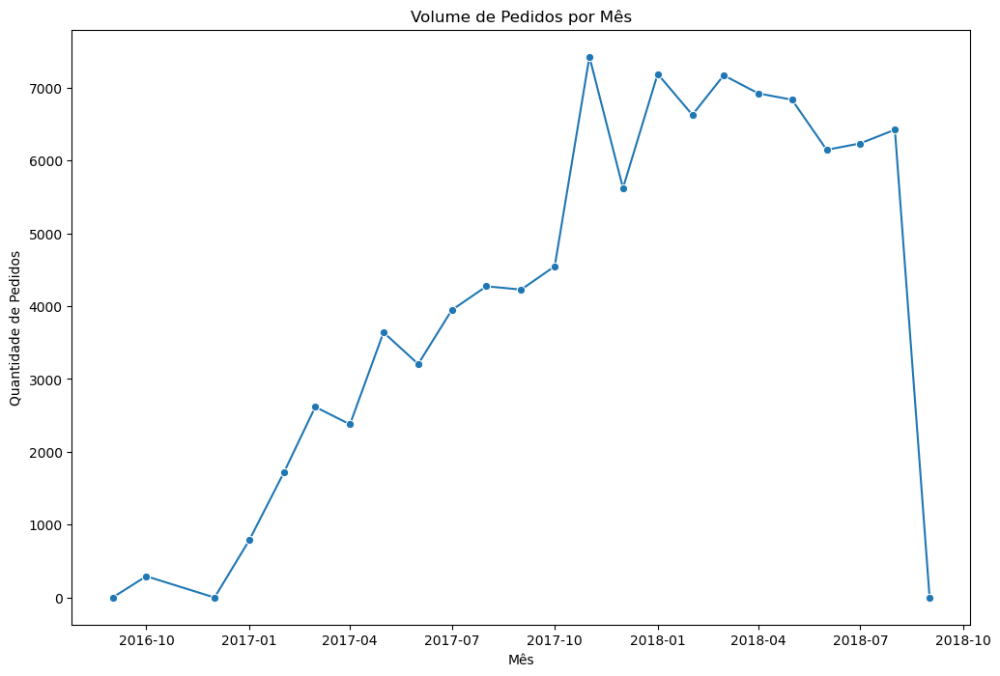

In [30]:
#sns.set_theme(style="whitegrid")

plt.figure(figsize=(12, 8))

sns.lineplot(
    data=pedidos_mensais,
    x="mes",
    y="qtd_pedidos",
    marker="o"
).set(
    title="Volume de Pedidos por Mês",
    xlabel="Mês",
    ylabel="Quantidade de Pedidos"
)


#### Insights/Resposta
O volume de pedidos cresceu de forma contínua (com variações mensais moderadas) entre setembro de 2016 e novembro de 2017, atingindo um pico nesse período. Em 2018, o volume se manteve estável, com pequenas variações.
Não há padrão sazonal evidente nas vendas, e a queda acentuada em setembro e outubro de 2018 provavelmente está relacionada a dados ausentes ou incompletos nesses meses.

In [31]:
df_orders.groupby(df_orders['order_purchase_timestamp'].dt.to_period('M'))['order_id'].count()

order_purchase_timestamp
2016-09       4
2016-10     324
2016-12       1
2017-01     800
2017-02    1780
2017-03    2682
2017-04    2404
2017-05    3700
2017-06    3245
2017-07    4026
2017-08    4331
2017-09    4285
2017-10    4631
2017-11    7544
2017-12    5673
2018-01    7269
2018-02    6728
2018-03    7211
2018-04    6939
2018-05    6873
2018-06    6167
2018-07    6292
2018-08    6512
2018-09      16
2018-10       4
Freq: M, Name: order_id, dtype: int64

#### b) Qual a distribuição do tempo de entrega dos pedidos?

In [32]:
query = """
    SELECT 
         DATE_DIFF('day', order_purchase_timestamp, order_delivered_customer_date) AS tempo_entrega_dias
    FROM orders
    WHERE order_delivered_customer_date IS NOT NULL
      AND order_purchase_timestamp IS NOT NULL
"""
df_tempo_entrega = duckdb.sql(query).df()

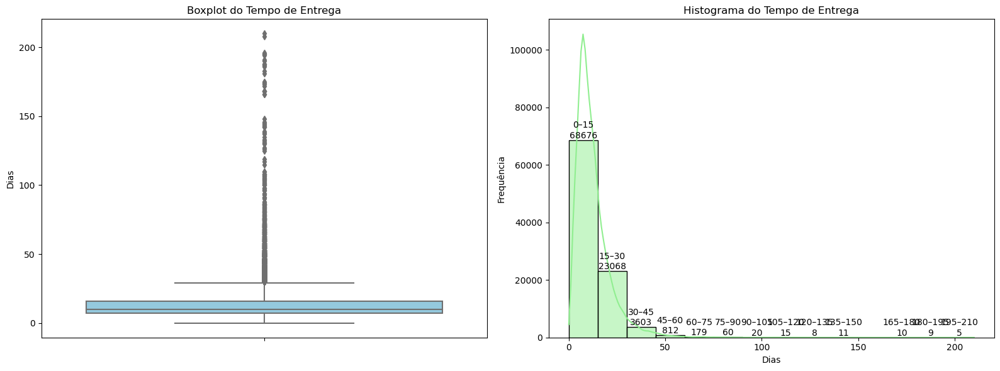

In [33]:
fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# Boxplot
sns.boxplot(y=df_tempo_entrega['tempo_entrega_dias'], ax=axes[0], color="skyblue")
axes[0].set_title('Boxplot do Tempo de Entrega')
axes[0].set_ylabel('Dias')

# Estatísticas descritivas
desc = df_tempo_entrega['tempo_entrega_dias'].describe()

q1 = desc['25%']
q3 = desc['75%']
iqr = q3 - q1
media = round(desc['mean'],0)

limite_inferior = q1 - 1.5 * iqr
limite_superior = q3 + 1.5 * iqr

stats = {
    'Limite Inf.': limite_inferior,
    'Min': desc['min'],
    'Q1': q1,
    'Mediana': desc['50%'],
    'Média': media,
    'Q3': q3,
    'Máx': desc['max'],    
    'Limite Sup.': limite_superior
}


# Histograma com 10 bins
sns.histplot(df_tempo_entrega['tempo_entrega_dias'], bins=14, kde=True, ax=axes[1], color="lightgreen")
axes[1].set_title('Histograma do Tempo de Entrega')
axes[1].set_xlabel('Dias')
axes[1].set_ylabel('Frequência')

# Rótulos de dados no histograma
bins = axes[1].patches
for patch in bins:
    height = patch.get_height()
    bin_left = patch.get_x()
    bin_width = patch.get_width()
    bin_right = bin_left + bin_width
    if height > 0:
        bin_label = f'{int(bin_left)}–{int(bin_right)}'
        axes[1].annotate(f'{bin_label}\n{int(height)}',
                         (bin_left + bin_width / 2, height),
                         ha='center', va='bottom', fontsize=10)

plt.tight_layout()
plt.show()

In [34]:
print(stats)

{'Limite Inf.': -6.5, 'Min': 0.0, 'Q1': 7.0, 'Mediana': 10.0, 'Média': 12.0, 'Q3': 16.0, 'Máx': 210.0, 'Limite Sup.': 29.5}


In [35]:
round(df_tempo_entrega[df_tempo_entrega['tempo_entrega_dias']<=30].shape[0]/df_orders.shape[0],2)

0.93

In [36]:
round(df_tempo_entrega[df_tempo_entrega['tempo_entrega_dias']<=30].shape[0]/df_tempo_entrega.shape[0],2)

0.96

#### Insights/Resposta e análise sobre o Tempo de Entrega
A maior parte das entregas está concentrada entre 16 e 29 dias. Isso significa que 75% das entregas são concluídas em até duas semanas, e 96% em até um mês.

Passando desse prazo, já começa a chamar atenção.
No Histograma, é possível ver um volume considerável de entregas que demoram 1 mês e meio, 2 meses, até 2 meses e meio. Depois disso, aparecem até casos mais extremos, com entregas que passam dos 3 meses e algumas chegando a mais de 200 dias.

Uma hipótese inicial ao observar esse comportamento é que essas entregas muito longas podem estar ligados a atrasos, e isso já dá um spoiler do desafio proposto: criar um modelo capaz de prever o prazo de entrega, ajudando a identificar e mitigar possíveis atrasos antes que eles aconteçam.

Além disso, vale levantar algumas hipóteses para entender melhor o que pode estar por trás desses atrasos. Será que eles estão mais concentrados em alguns estados específicos, em determinadas categorias de produto ou em alguns períodos do ano?

Por exemplo, observando o crescimento constante no volume de pedidos ao longo do tempo, pode ser que em algum momento a empresa tenha enfrentado dificuldades para acompanhar a demanda por falta de estrutura ou equipe suficiente, o que pode ter gerado atrasos acima do normal. Esses pontos podem indicar possíveis gargalos logísticos e desvios no processo, que merecem atenção em análises futuras, principalmente para empresas que buscam entender melhor sua performance e melhorar a experiência do cliente.

#### c) Qual a relação entre o valor do frete e a distância de entrega?

Vale ressaltar que durante essa etapa, contei com o apoio de um assistente de IA (ChatGPT) apenas como suporte técnico para entender melhor como calcular a distância entre o cliente e o vendedor, um desafio que inicialmente eu não sabia como abordar. Com base nas orientações iniciais fornecidas pela ferramenta, fiz os devidos ajustes na query e no cálculo da distância para garantir que os dados estivessem consistentes com a realidade do projeto e com a estrutura do dataset. Todo o restante da análise, interpretação estatística e visualização foi feita por mim. A decisão de buscar apoio foi pensada para garantir qualidade técnica na entrega, sem comprometer minha autonomia e capacidade de análise.

In [37]:
# Pegando o par de coordenadas (lat, lon) por prefixo de cep usando a média
query_zip_coords = """
SELECT DISTINCT
    geolocation_zip_code_prefix AS zip,
    AVG(geolocation_lat) AS lat,
    AVG(geolocation_lng) AS lng
FROM geolocation
GROUP BY geolocation_zip_code_prefix
"""
df_zip_coords = duckdb.sql(query_zip_coords).df()
duckdb.register("zip_coords", df_zip_coords)


In [38]:
# Gerar todos os pares de prefixo de cep do cliente e vendedor por pedido
query_zip_pairs = """
SELECT
    DISTINCT
    c.customer_zip_code_prefix AS customer_zip,
    s.seller_zip_code_prefix AS seller_zip
FROM orders o
JOIN customers c ON o.customer_id = c.customer_id
JOIN order_items oi ON o.order_id = oi.order_id
JOIN sellers s ON oi.seller_id = s.seller_id
"""
df_zip_pairs = duckdb.sql(query_zip_pairs).df()
duckdb.register("zip_pairs", df_zip_pairs)


In [39]:
# Juntar os pares com as coordenadas e calcular a distância (Haversine).O Haversine é uma fórmula matemática
# utilizada para calcular a distância entre dois pontos em uma esfera, levando em consideração a curvatura da Terra
# a partir de suas latitudes e longitudes (que é o caso aqui).
query_dist_zip = """
SELECT
    zp.customer_zip,
    zp.seller_zip,
    6371 * ACOS(
        COS(RADIANS(c.lat)) * COS(RADIANS(s.lat)) *
        COS(RADIANS(s.lng) - RADIANS(c.lng)) +
        SIN(RADIANS(c.lat)) * SIN(RADIANS(s.lat))
    ) AS distancia_km
FROM zip_pairs zp
JOIN zip_coords c ON zp.customer_zip = c.zip
JOIN zip_coords s ON zp.seller_zip = s.zip
WHERE
    -- prevenir problemas com ACOS fora do intervalo [-1,1]
    COS(RADIANS(c.lat)) * COS(RADIANS(s.lat)) *
    COS(RADIANS(s.lng) - RADIANS(c.lng)) +
    SIN(RADIANS(c.lat)) * SIN(RADIANS(s.lat)) BETWEEN -1 AND 1
"""
df_dist_zip = duckdb.sql(query_dist_zip).df()
duckdb.register("dist_zip", df_dist_zip)


In [40]:
# Voltar para os pedidos e juntar com distância calculada na query anterior
query_final = """
SELECT
    oi.order_id,
    oi.freight_value,
    oi.price,
    dz.distancia_km
FROM order_items oi
LEFT JOIN orders o ON oi.order_id = o.order_id
LEFT JOIN customers c ON o.customer_id = c.customer_id
LEFT JOIN sellers s ON oi.seller_id = s.seller_id
LEFT JOIN dist_zip dz
    ON c.customer_zip_code_prefix = dz.customer_zip
    AND s.seller_zip_code_prefix = dz.seller_zip
"""
df_distancia = duckdb.sql(query_final).df()


Apenas para ter as cidades e estados para validar as distancias

In [41]:
# 1) Pegue customer_zip e seller_zip por order_id
query_order_zip = """
SELECT
    o.order_id,
    c.customer_zip_code_prefix AS customer_zip,
    s.seller_zip_code_prefix AS seller_zip,
    c.customer_city,
    s.seller_city,
    c.customer_state,
    s.seller_state
FROM orders o
JOIN customers c ON o.customer_id = c.customer_id
JOIN order_items oi ON o.order_id = oi.order_id
JOIN sellers s ON oi.seller_id = s.seller_id
"""
df_order_zip = duckdb.sql(query_order_zip).df()
duckdb.register("order_zip", df_order_zip)


In [42]:
df_resumo = (
    df_distancia
    .groupby('order_id', as_index=False)
    .agg({
        'freight_value': 'sum',
        'price': 'sum',
        'distancia_km': 'first'  # ou 'mean' se houver variação
    })
)


In [43]:
df_resumo

,order_id,freight_value,price,distancia_km
0,00010242fe8c5a6d1ba2dd792cb16214,13.29,58.90,301.419473
1,00018f77f2f0320c557190d7a144bdd3,19.93,239.90,585.068784
2,000229ec398224ef6ca0657da4fc703e,17.87,199.00,312.386590
3,00024acbcdf0a6daa1e931b038114c75,12.79,12.99,295.481182
4,00042b26cf59d7ce69dfabb4e55b4fd9,18.14,199.90,646.149244
...,...,...,...,...
98661,fffc94f6ce00a00581880bf54a75a037,43.41,299.99,2754.352519
98662,fffcd46ef2263f404302a634eb57f7eb,36.53,350.00,353.185909
98663,fffce4705a9662cd70adb13d4a31832d,16.95,99.90,338.938353
98664,fffe18544ffabc95dfada21779c9644f,8.72,55.99,72.529042


In [44]:
df_order_zip_unico = (
    df_order_zip
    .groupby('order_id', as_index=False)
    .agg({
        'customer_zip': 'first',
        'seller_zip': 'first',
        'customer_city': 'first',
        'seller_city': 'first',
        'customer_state': 'first',
        'seller_state': 'first'
    })
)


In [45]:
# 3) Finalmente, junte com o df_distancia pelo order_id
df_final = df_resumo.merge(df_order_zip_unico, how='inner', on='order_id')

In [46]:
df_final

,order_id,freight_value,price,distancia_km,customer_zip,seller_zip,customer_city,seller_city,customer_state,seller_state
0,00010242fe8c5a6d1ba2dd792cb16214,13.29,58.90,301.419473,28013,27277,campos dos goytacazes,volta redonda,RJ,SP
1,00018f77f2f0320c557190d7a144bdd3,19.93,239.90,585.068784,15775,3471,santa fe do sul,sao paulo,SP,SP
2,000229ec398224ef6ca0657da4fc703e,17.87,199.00,312.386590,35661,37564,para de minas,borda da mata,MG,MG
3,00024acbcdf0a6daa1e931b038114c75,12.79,12.99,295.481182,12952,14403,atibaia,franca,SP,SP
4,00042b26cf59d7ce69dfabb4e55b4fd9,18.14,199.90,646.149244,13226,87900,varzea paulista,loanda,SP,PR
...,...,...,...,...,...,...,...,...,...,...
98661,fffc94f6ce00a00581880bf54a75a037,43.41,299.99,2754.352519,65077,88303,sao luis,itajai,MA,SC
98662,fffcd46ef2263f404302a634eb57f7eb,36.53,350.00,353.185909,81690,1206,curitiba,sao paulo,PR,SP
98663,fffce4705a9662cd70adb13d4a31832d,16.95,99.90,338.938353,4039,80610,sao paulo,curitiba,SP,PR
98664,fffe18544ffabc95dfada21779c9644f,8.72,55.99,72.529042,13289,4733,vinhedo,sao paulo,SP,SP


In [47]:
# Garantir que não tem valores nulos
df_corr = df_resumo.dropna(subset=['freight_value', 'distancia_km'])

# Pearson
r, p_value = pearsonr(df_corr['freight_value'], df_corr['distancia_km'])

# R²
X = df_corr[['distancia_km']].values
y = df_corr['freight_value'].values
model = LinearRegression().fit(X, y)
r2 = model.score(X, y)


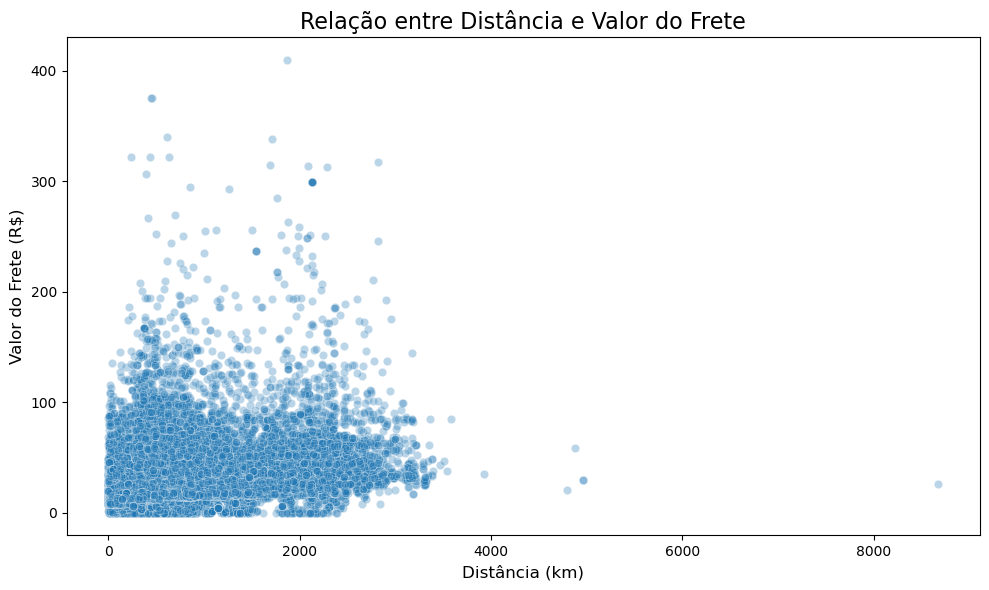

In [48]:
plt.figure(figsize=(10, 6))
sns.scatterplot(data=df_distancia, x="distancia_km", y="freight_value", alpha=0.3)

# Títulos e rótulos
plt.title("Relação entre Distância e Valor do Frete", fontsize=16)
plt.xlabel("Distância (km)", fontsize=12)
plt.ylabel("Valor do Frete (R$)", fontsize=12)

# Exibe o gráfico
plt.tight_layout()
plt.show()

In [49]:
r

0.31320850572332715

#### Insights/Resposta

 O resultado foi r = 0,31, indicando uma correlação positiva fraca. Como também dar para observar no gráfico de dispersão.

In [50]:
r2

0.09809956805743925

 R² = 0,098, o que mostra que a distância explica apenas cerca de 9,8% da variação no valor do frete.

Embora exista uma relação positiva entre o frete e a distância, a distância por si só não explica bem a variação do preço do frete. Outros fatores devem estar influenciando o custo do frete.

Uma hipótese seria a quantidade de produtos do pedido que por consequencia aumenta o peso, isso tem impacto no calculo do preço do frete. A quantidade e peso dos produtos podem explicar também o preço do frete.

#### d) Quais são as categorias de produtos mais vendidas em termos de faturamento?

In [51]:
query_faturamento = """
SELECT 
    ct.product_category_name AS categoria,
    ROUND(SUM(oi.price + oi.freight_value), 2) AS faturamento_total
FROM order_items oi
JOIN products p ON oi.product_id = p.product_id
JOIN category_translation ct ON p.product_category_name = ct.product_category_name
JOIN orders o ON oi.order_id = o.order_id
WHERE o.order_status = 'delivered'
GROUP BY ct.product_category_name
ORDER BY faturamento_total DESC
"""
df_faturamento = duckdb.sql(query_faturamento).df()


In [52]:
# Calcula o total geral de faturamento
total_geral = df_faturamento["faturamento_total"].sum()

# Ordena por faturamento
df_faturamento_pareto = df_faturamento.sort_values("faturamento_total", ascending=False)

# Calcula colunas acumuladas
df_faturamento_pareto["faturamento_acumulado"] = df_faturamento_pareto["faturamento_total"].cumsum()
df_faturamento_pareto["frequencia_relativa_acumulada"] = round((df_faturamento_pareto["faturamento_acumulado"] / total_geral),2) * 100

In [53]:
df_faturamento_pareto.head(10)

,categoria,faturamento_total,faturamento_acumulado,frequencia_relativa_acumulada
0,beleza_saude,1412089.53,1412089.53,9.0
1,relogios_presentes,1264333.12,2676422.65,18.0
2,cama_mesa_banho,1225209.26,3901631.91,26.0
3,esporte_lazer,1118256.91,5019888.82,33.0
4,informatica_acessorios,1032723.77,6052612.59,40.0
5,moveis_decoracao,880329.92,6932942.51,46.0
6,utilidades_domesticas,758392.25,7691334.76,51.0
7,cool_stuff,691680.89,8383015.65,55.0
8,automotivo,669454.75,9052470.40,59.0
9,ferramentas_jardim,567145.68,9619616.08,63.0


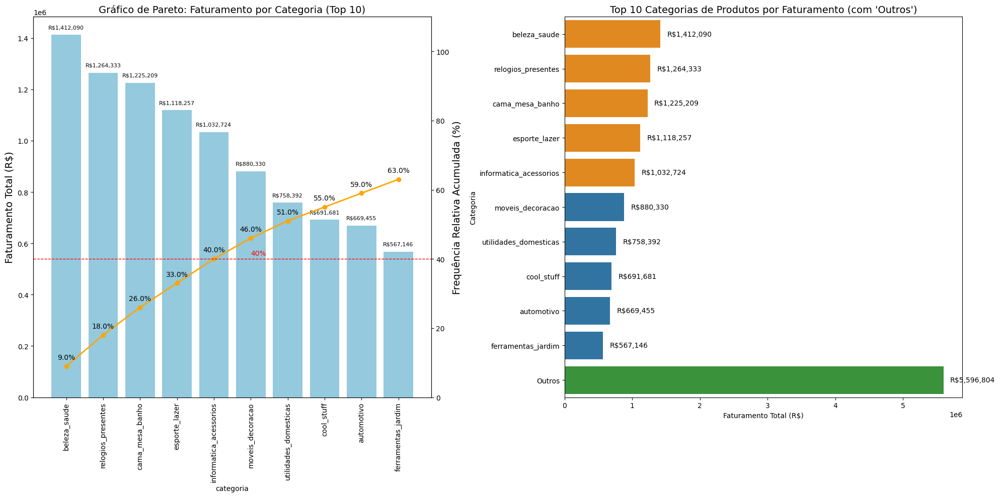

In [54]:
# Garante os dados ordenados
df_plot = df_faturamento.sort_values("faturamento_total", ascending=False).copy()
top10 = df_plot.head(10).copy()

# --- GRÁFICO 1: Pareto (Top 10) ---
df_plot_pareto = df_faturamento_pareto.sort_values("faturamento_total", ascending=False).copy()
top10_pareto = df_plot_pareto.head(10)

fig, ax = plt.subplots(1, 2, figsize=(20, 10))

# Gráfico de barras (ax[0])
bars = sns.barplot(
    data=top10_pareto,
    x="categoria",
    y="faturamento_total",
    ax=ax[0],
    color="skyblue"
)
ax[0].set_ylabel("Faturamento Total (R$)", fontsize=14)
ax[0].tick_params(axis='x', rotation=90)

# Rótulos nas barras
for bar in bars.patches:
    height = bar.get_height()
    ax[0].text(
        bar.get_x() + bar.get_width() / 2,
        height + 20000,
        f'R${height:,.0f}',
        ha='center',
        va='bottom',
        fontsize=8
    )

# Linha da frequência acumulada
ax2 = ax[0].twinx()
ax2.plot(
    top10_pareto["categoria"],
    top10_pareto["frequencia_relativa_acumulada"],
    color="orange",
    marker="o",
    linewidth=2
)
ax2.set_ylabel("Frequência Relativa Acumulada (%)", fontsize=14)
ax2.set_ylim(0, 110)

# Rótulos nos pontos da linha
for i, pct in enumerate(top10_pareto["frequencia_relativa_acumulada"]):
    ax2.text(
        i,
        pct + 2,
        f'{pct:.1f}%',
        color="black",
        ha="center",
        fontsize=10
    )

# Linha de referência 40%
ax2.axhline(40, color="red", linestyle="--", linewidth=1)
ax2.text(len(top10) - 5, 41, "40%", color="red")

ax[0].set_title("Gráfico de Pareto: Faturamento por Categoria (Top 10)", fontsize=14)

# --- GRÁFICO 2: Top 10 + Outros ---
top10 = df_plot.head(10)
outros = pd.DataFrame({
    "categoria": ["Outros"],
    "faturamento_total": [df_plot.iloc[10:]["faturamento_total"].sum()]
})
df_final = pd.concat([top10, outros], ignore_index=True)

# Cores para destaque
cores = [
    "#FF8C00" if i < 5 else "#2ca02c" if i == len(df_final) - 1 else "#1f77b4"
    for i in range(len(df_final))
]

# Gráfico horizontal de barras (ax[1])
bars2 = sns.barplot(
    data=df_final,
    y="categoria",
    x="faturamento_total",
    ax=ax[1],
    palette=cores
)

# Rótulos nas barras
for bar in bars2.patches:
    width = bar.get_width()
    ax[1].text(width + 100000, bar.get_y() + bar.get_height() / 2,
               f'R${width:,.0f}', va='center')

ax[1].set_title("Top 10 Categorias de Produtos por Faturamento (com 'Outros')", fontsize=14)
ax[1].set_xlabel("Faturamento Total (R$)")
ax[1].set_ylabel("Categoria")

# Layout final
plt.tight_layout()
plt.show()

#### Insights/Reposta
Ao analisar o faturamento por categoria de produto, observamos que há um total de **72 categorias** distintas, mas apenas **10 delas (14%) são responsáveis por 63% do faturamento total** do período. Essa concentração está alinhada com a **Regra de Pareto**, onde uma minoria das categorias representa a maior parte do resultado financeiro.

Focando ainda mais, **as 5 principais categorias (7%)** — todas com faturamento superior ou muito próximo de **R$1 milhão** — já representam **40% de todo o faturamento**. Isso evidencia que o negócio é altamente dependente de um pequeno conjunto de categorias para gerar receita.

Essa concentração pode ser estratégica, mas também representa risco: flutuações nessas poucas categorias podem impactar fortemente os resultados gerais.

#### e) Quais estados brasileiros possuem o maior valor médio de pedido?

O valor do pedido eu estou pegando do contexto dado pelos admins do dataset no kaggle.

Exemplo tirado do kaggle
The total order_item value is: 21.33 * 3 = 63.99

The total freight value is: 15.10 * 3 = 45.30

The total order value (product + freight) is: 45.30 + 63.99 = 109.29

seria essa soma eu teria o valor do pedido

In [55]:
query_ticket_medio = """
SELECT 
    c.customer_state AS estado,
    ROUND(AVG(oi.price + oi.freight_value), 2) AS valor_medio_pedido
FROM order_items oi
JOIN orders o ON oi.order_id = o.order_id
JOIN customers c ON o.customer_id = c.customer_id
WHERE o.order_status = 'delivered'
GROUP BY c.customer_state
ORDER BY valor_medio_pedido DESC
"""
df_ticket_medio = duckdb.sql(query_ticket_medio).df()


In [56]:
df_ticket_medio

,estado,valor_medio_pedido
0,PB,235.22
1,AL,220.54
2,AC,215.11
3,RO,208.67
4,PA,201.16
5,PI,201.11
6,AP,199.28
7,RR,196.51
8,TO,193.57
9,RN,193.31


In [57]:
query_ticket_medio_price_only = """
SELECT 
    c.customer_state AS estado,
    ROUND(AVG(oi.price), 2) AS valor_medio_pedido
FROM order_items oi
JOIN orders o ON oi.order_id = o.order_id
JOIN customers c ON o.customer_id = c.customer_id
WHERE o.order_status = 'delivered'
GROUP BY c.customer_state
ORDER BY valor_medio_pedido DESC
"""
df_ticket_medio_price_only = duckdb.sql(query_ticket_medio_price_only).df()

In [58]:
df_ticket_medio_price_only

,estado,valor_medio_pedido
0,PB,192.13
1,AL,184.67
2,AC,175.07
3,RO,167.34
4,PA,165.53
5,AP,165.12
6,PI,161.99
7,RN,157.59
8,TO,156.14
9,CE,154.11


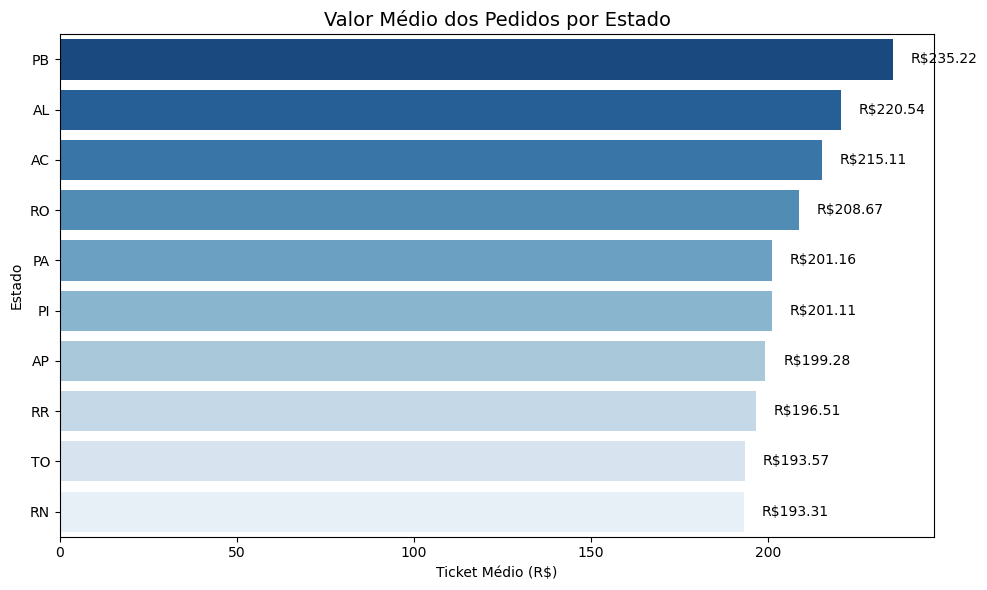

In [59]:
# Ordena os estados por ticket médio
df_top_estados = df_ticket_medio.sort_values("valor_medio_pedido", ascending=True)

plt.figure(figsize=(10, 6))

bars = sns.barplot(data=df_top_estados.tail(10), x="valor_medio_pedido", y="estado", palette='Blues')

for bar in bars.patches:
    width = bar.get_width()
    plt.text(width + 5, bar.get_y() + bar.get_height() / 2,
             f'R${width:,.2f}', va='center')

plt.title("Valor Médio dos Pedidos por Estado", fontsize=14)
plt.xlabel("Ticket Médio (R$)")
plt.ylabel("Estado")
plt.tight_layout()
plt.gca().invert_yaxis()
plt.show()


#### Insights/Resposta
Ao analisar o valor médio dos pedidos por estado, observei que os maiores tickets médios estão concentrados nas regiões Norte e Nordeste do Brasil. Pensei se isso seria devido ao valor do frete imbutido no valor total do pedido, mas não o comportamento é o mesmo.
O que pode explicar esse comportamento?

#### Hipóteses

- Menor frequência de pedidos, com compras mais concentradas em valor;

- Menor concorrência ou disponibilidade de vendedores locais, o que pode elevar os preços médios dos produtos;

- Diferenças regionais no perfil de consumo, como preferência por determinados tipos de produtos de maior valor agregado.

## 3. Solução de Problemas de Negócio

#### 1. Análise de Retenção: Calcule a taxa de clientes recorrentes. Considere um cliente recorrente aquele que fez mais de um pedido no período analisado. Quais insights podemos extrair destes dados?

In [60]:
query_retetion_rate = """
SELECT
    c.customer_unique_id,
    COUNT(o.order_id) AS total_orders
FROM orders o
JOIN customers c ON c.customer_id = o.customer_id
WHERE o.order_status = 'delivered'
GROUP BY c.customer_unique_id
"""
df_retetion_rate = duckdb.query(query_retetion_rate).to_df()

In [61]:
total_clients = df_retetion_rate.shape[0]
retetion = df_retetion_rate[df_retetion_rate['total_orders'] > 1].shape[0]
retetion_rate = retetion / total_clients

In [62]:
round(retetion_rate,3) * 100

3.0

A taxa de retenção de 3% indica que o comportamento predominante entre os clientes é o de compra única. Ou seja, majoritariamente os consumidores compram apenas uma vez durante o período disponível nos dados.


**OBS/SPOILER: TEM MAIS INSIGHTS SOBRE RETENÇÃO NA SEGMENTAÇÃO DOS CLIENTES.** 

#### 2. Predição de Atraso: Crie um modelo simples para prever se um pedido será entregue com atraso.

In [63]:
query_is_late = """
SELECT                    
        
        o.order_id,
        c.customer_unique_id,
        c.customer_state,
        s.seller_state,
        -- Diferença entre datas (em dias)        
        DATE_DIFF('day', o.order_purchase_timestamp, o.order_delivered_customer_date) AS tempo_entrega_dias,
        
        -- Flag de atraso
        CASE 
            WHEN o.order_delivered_customer_date > o.order_estimated_delivery_date THEN 1 
            ELSE 0 
        END AS is_late,
        
        -- Info do item (para categoria, seller_id, freight)        
        oi.freight_value,
        oi.price,
        
        -- Info de produto
        p.product_category_name,
        p.product_weight_g,
        p.product_length_cm,
        p.product_height_cm,
        p.product_width_cm,

        -- Pagamento
        op.payment_type,
        op.payment_installments
              
        
        
    FROM orders o
    LEFT JOIN order_items oi ON o.order_id = oi.order_id
    LEFT JOIN products p ON oi.product_id = p.product_id
    LEFT JOIN customers c ON o.customer_id = c.customer_id     
    LEFT JOIN order_payments op ON o.order_id = op.order_id    
    LEFT JOIN sellers s ON s.seller_id = oi.seller_id

    WHERE o.order_status = 'delivered'
"""
df_is_late = duckdb.query(query_is_late).to_df()


In [64]:
df_is_late

,order_id,customer_unique_id,customer_state,seller_state,tempo_entrega_dias,is_late,freight_value,price,product_category_name,product_weight_g,product_length_cm,product_height_cm,product_width_cm,payment_type,payment_installments
0,e880a2a0f19dcb0f2ef51fed71ef34c9,7f61eced85edf4c04ed04e441ba02cae,RJ,SP,26.0,0,19.32,17.99,cama_mesa_banho,200.0,20.0,10.0,15.0,credit_card,7.0
1,e880a2a0f19dcb0f2ef51fed71ef34c9,7f61eced85edf4c04ed04e441ba02cae,RJ,SP,26.0,0,19.32,17.99,cama_mesa_banho,200.0,20.0,10.0,15.0,credit_card,7.0
2,e880c960b083af6aae64e809acf0693c,9832ae2f7d3e5fa4c7a1a06e9551bc61,RJ,SP,14.0,0,15.86,157.99,relogios_presentes,444.0,20.0,14.0,16.0,credit_card,2.0
3,e880c960b083af6aae64e809acf0693c,9832ae2f7d3e5fa4c7a1a06e9551bc61,RJ,SP,14.0,0,15.86,157.99,relogios_presentes,444.0,20.0,14.0,16.0,credit_card,2.0
4,e881dae0437e8efde70b242d9a1b5a33,998137918d30f89547129f9f991f98e8,SP,SP,11.0,0,11.85,46.00,perfumaria,75.0,11.0,11.0,8.0,credit_card,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
115033,98f0e2b0d85754ca3b4e06d70f0f63a2,0fdc0d21e1983e8af4d399e17671f76d,MG,SP,8.0,0,14.43,97.77,outros,1350.0,16.0,7.0,20.0,credit_card,2.0
115034,b3199c2b795211713ca16c887287db5b,c6486396f81f9bd9ac88eec710284543,SC,MG,14.0,0,15.79,39.99,perfumaria,200.0,22.0,10.0,19.0,credit_card,1.0
115035,e733891de1c5b78d0d7f77863402659b,baffecbd1fcc31f8a415cef1cd8cf772,SP,SP,7.0,0,13.62,169.00,beleza_saude,650.0,14.0,11.0,12.0,credit_card,4.0
115036,bdcf9c2f3ef0c55dc1273dd2c507b0f8,fa09d685759fe05a524c8563253344f3,BA,SP,14.0,0,23.99,188.90,utilidades_domesticas,3000.0,22.0,51.0,22.0,credit_card,1.0


In [65]:
def aplicar_pareto_frequencia(df, coluna, limite=0.8):
    # Conta as ocorrências
    contagem = df[coluna].value_counts().reset_index()
    contagem.columns = [coluna, "frequencia"]

    # Total geral
    total = contagem["frequencia"].sum()

    # Frequência acumulada
    contagem["frequencia_acumulada"] = contagem["frequencia"].cumsum()
    contagem["frequencia_relativa_acumulada"] = contagem["frequencia_acumulada"] / total

    # Categorias que acumulam até o limite
    principais = contagem[contagem["frequencia_relativa_acumulada"] <= limite][coluna].tolist()

    # Substitui no df
    #df[coluna] = df[coluna].apply(lambda x: x if x in principais else "outras")

    return df, contagem


In [66]:
df_is_late, pareto_product_category = aplicar_pareto_frequencia(df_is_late, "product_category_name")
df_is_late, pareto_payment_type = aplicar_pareto_frequencia(df_is_late, "payment_type")
df_is_late, pareto_customer_state = aplicar_pareto_frequencia(df_is_late, "customer_state")
df_is_late, pareto_seller_state = aplicar_pareto_frequencia(df_is_late, "seller_state")

In [67]:
pareto_product_category.head(9)

,product_category_name,frequencia,frequencia_acumulada,frequencia_relativa_acumulada
0,cama_mesa_banho,11650,11650,0.101271
1,beleza_saude,9762,21412,0.186130
2,esporte_lazer,8733,30145,0.262044
3,moveis_decoracao,8557,38702,0.336428
4,informatica_acessorios,7898,46600,0.405084
5,utilidades_domesticas,7172,53772,0.467428
6,relogios_presentes,6065,59837,0.520150
7,telefonia,4603,64440,0.560163
8,ferramentas_jardim,4464,68904,0.598967


In [68]:
pareto_payment_type

,payment_type,frequencia,frequencia_acumulada,frequencia_relativa_acumulada
0,credit_card,84896,84896,0.738001
1,boleto,22362,107258,0.932394
2,voucher,6123,113381,0.985622
3,debit_card,1654,115035,1.000000


In [69]:
pareto_customer_state

,customer_state,frequencia,frequencia_acumulada,frequencia_relativa_acumulada
0,SP,48525,48525,0.421817
1,RJ,14873,63398,0.551105
2,MG,13417,76815,0.667736
3,RS,6383,83198,0.723222
4,PR,5868,89066,0.774231
5,SC,4222,93288,0.810932
6,BA,3930,97218,0.845095
7,DF,2421,99639,0.866140
8,GO,2372,102011,0.886759
9,ES,2307,104318,0.906813


In [70]:
pareto_seller_state

,seller_state,frequencia,frequencia_acumulada,frequencia_relativa_acumulada
0,SP,82061,82061,0.713338
1,MG,9026,91087,0.791799
2,PR,8798,99885,0.868278
3,RJ,4877,104762,0.910673
4,SC,4180,108942,0.947009
5,RS,2251,111193,0.966576
6,DF,930,112123,0.974661
7,BA,679,112802,0.980563
8,GO,536,113338,0.985222
9,PE,462,113800,0.989238


In [71]:
top9_produtos = df_is_late['product_category_name'].value_counts().nlargest(9).index
df_is_late['product_category_name'] = df_is_late['product_category_name'].apply(
    lambda x: x if x in top9_produtos else 'outras'
)

In [72]:
df_is_late['payment_type'] = df_is_late['payment_type'].apply(
    lambda x: x if x == 'credit_card' else 'outros'
)

In [73]:
top6_estados_c = df_is_late['customer_state'].value_counts().nlargest(6).index
df_is_late['customer_state'] = df_is_late['customer_state'].apply(
    lambda x: x if x in top6_estados_c else 'outras'
)


top6_estados_s = df_is_late['seller_state'].value_counts().nlargest(6).index
df_is_late['seller_state'] = df_is_late['seller_state'].apply(
    lambda x: x if x in top6_estados_s else 'outras'
)

In [74]:
df_is_late = df_is_late.drop_duplicates(subset='order_id')

In [75]:
df_is_late

,order_id,customer_unique_id,customer_state,seller_state,tempo_entrega_dias,is_late,freight_value,price,product_category_name,product_weight_g,product_length_cm,product_height_cm,product_width_cm,payment_type,payment_installments
0,e880a2a0f19dcb0f2ef51fed71ef34c9,7f61eced85edf4c04ed04e441ba02cae,RJ,SP,26.0,0,19.32,17.99,cama_mesa_banho,200.0,20.0,10.0,15.0,credit_card,7.0
2,e880c960b083af6aae64e809acf0693c,9832ae2f7d3e5fa4c7a1a06e9551bc61,RJ,SP,14.0,0,15.86,157.99,relogios_presentes,444.0,20.0,14.0,16.0,credit_card,2.0
4,e881dae0437e8efde70b242d9a1b5a33,998137918d30f89547129f9f991f98e8,SP,SP,11.0,0,11.85,46.00,outras,75.0,11.0,11.0,8.0,credit_card,1.0
6,e88333581538e25e87d48b2dbc1782b8,49be61a35d19a1411e1ab4d556a90a85,SP,SP,24.0,1,17.75,120.00,relogios_presentes,584.0,16.0,11.0,13.0,credit_card,3.0
7,e8844ed350d0a0556e982b89e2d727cb,229af2bc314525d19240f5c62dccfbbb,outras,outras,13.0,0,27.98,385.90,outras,150.0,18.0,9.0,11.0,credit_card,6.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
113732,e7ce593c46f447cf67788cfb73581ad7,00d76f8bb8df7e07711da4076c52ffe0,MG,SP,6.0,0,18.84,105.99,cama_mesa_banho,2250.0,36.0,16.0,36.0,outros,1.0
113733,e592e00712df4f05bd73ad01993c0251,186faf3198f9fb8a82531e639b54db8a,SP,SP,8.0,0,5.88,83.79,cama_mesa_banho,1383.0,50.0,10.0,40.0,credit_card,5.0
113734,e67a3047fa3e8b2aecd942f3b25b0e3f,ae8a8192571b12c25960dea678e968da,MG,MG,5.0,0,12.23,54.00,outras,1300.0,19.0,12.0,12.0,credit_card,1.0
113735,e67f76501c34f4adb5587ee50a6474c6,78a08bdc420769677ffa6eacb225561b,outras,MG,19.0,0,21.25,64.60,outras,1800.0,17.0,17.0,17.0,credit_card,1.0


In [76]:
df_is_late_rl = pd.get_dummies(df_is_late,
                               columns=['product_category_name',
                                        'payment_type',
                                        'customer_state',
                                        'seller_state'],
                               drop_first=True)

In [77]:
df_is_late_rl.columns

Index(['order_id', 'customer_unique_id', 'tempo_entrega_dias', 'is_late',
       'freight_value', 'price', 'product_weight_g', 'product_length_cm',
       'product_height_cm', 'product_width_cm', 'payment_installments',
       'product_category_name_cama_mesa_banho',
       'product_category_name_esporte_lazer',
       'product_category_name_ferramentas_jardim',
       'product_category_name_informatica_acessorios',
       'product_category_name_moveis_decoracao',
       'product_category_name_outras',
       'product_category_name_relogios_presentes',
       'product_category_name_telefonia',
       'product_category_name_utilidades_domesticas', 'payment_type_outros',
       'customer_state_PR', 'customer_state_RJ', 'customer_state_RS',
       'customer_state_SC', 'customer_state_SP', 'customer_state_outras',
       'seller_state_PR', 'seller_state_RJ', 'seller_state_RS',
       'seller_state_SC', 'seller_state_SP', 'seller_state_outras'],
      dtype='object')

In [78]:
df_is_late_rl = df_is_late_rl.groupby('customer_unique_id').agg({
    'tempo_entrega_dias': 'first',
    'is_late': 'first',
    'freight_value': 'sum',
    'price': 'sum',
    'product_weight_g': 'sum',
    'product_length_cm': 'mean',
    'product_height_cm': 'mean',
    'product_width_cm': 'mean',    
    'payment_installments': 'first',       
    # One-hot columns: soma para representar presença de cada categoria
    'product_category_name_cama_mesa_banho': 'max',
    'product_category_name_esporte_lazer': 'max',
    'product_category_name_ferramentas_jardim': 'max',
    'product_category_name_informatica_acessorios': 'max',
    'product_category_name_moveis_decoracao': 'max',
    'product_category_name_outras': 'max',
    'product_category_name_relogios_presentes': 'max',
    'product_category_name_telefonia': 'max',
    'product_category_name_utilidades_domesticas': 'max',
    'payment_type_outros': 'max',
    'customer_state_PR': 'max',
    'customer_state_RJ': 'max',
    'customer_state_RS': 'max',    
    'customer_state_SC': 'max',
    'customer_state_SP': 'max',
    'customer_state_outras': 'max',
    'seller_state_PR': 'max',
    'seller_state_RJ': 'max',
    'seller_state_RS': 'max',
    'seller_state_SC': 'max',
    'seller_state_SP': 'max',
    'seller_state_outras': 'max'
}).reset_index()


In [79]:
df_is_late_rl['is_late'].mean()

0.08135349943229289

In [80]:
from sklearn.preprocessing import StandardScaler

numericas = [
    'tempo_entrega_dias', 'freight_value', 'price',
    'product_weight_g', 'product_length_cm', 'product_height_cm',
    'product_width_cm']

scaler = StandardScaler()

In [81]:
df_is_late_rl = df_is_late_rl.drop('customer_unique_id', axis=1)

In [82]:
# o volume do restante dos nulos é muito baixo a decisão foi dropar
df_is_late_rl = df_is_late_rl.dropna()

In [83]:
from sklearn.model_selection import train_test_split

# X: todas as features menos 'is_late'
X = df_is_late_rl.drop("is_late", axis=1)
y = df_is_late_rl["is_late"]

# separa treino e teste
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=42, stratify=y)

In [84]:
X_train[numericas] = scaler.fit_transform(X_train[numericas])
X_test[numericas] = scaler.transform(X_test[numericas])

In [85]:
from sklearn.linear_model import LogisticRegression

modelo = LogisticRegression(max_iter=1000, random_state=42)
modelo.fit(X_train, y_train)


LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=1000,
                   multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=42, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)

In [86]:
from sklearn.metrics import classification_report, confusion_matrix, roc_auc_score

y_pred = modelo.predict(X_test)
y_proba = modelo.predict_proba(X_test)[:,1]

# Métricas principais
print(confusion_matrix(y_test, y_pred))
print(classification_report(y_test, y_pred))
print("ROC AUC:", round(roc_auc_score(y_test, y_proba), 3))


[[21199   237]
 [  831  1067]]
              precision    recall  f1-score   support

           0       0.96      0.99      0.98     21436
           1       0.82      0.56      0.67      1898

    accuracy                           0.95     23334
   macro avg       0.89      0.78      0.82     23334
weighted avg       0.95      0.95      0.95     23334

ROC AUC: 0.944


In [87]:
import pandas as pd
import matplotlib.pyplot as plt

coeficientes = pd.Series(modelo.coef_[0], index=X_train.columns)
importancia = coeficientes.sort_values(key=abs, ascending=False)

# Mostrar as 10 variáveis mais influentes (positiva ou negativa)
print(importancia)

tempo_entrega_dias                              2.725077
customer_state_SP                               1.283790
customer_state_RS                              -1.245621
customer_state_outras                          -1.025229
seller_state_SP                                 0.950412
seller_state_RJ                                 0.789172
product_category_name_relogios_presentes       -0.509822
seller_state_outras                             0.444047
product_category_name_informatica_acessorios   -0.407787
product_category_name_cama_mesa_banho          -0.390483
customer_state_PR                              -0.380941
customer_state_SC                              -0.347511
product_category_name_telefonia                -0.282763
product_category_name_utilidades_domesticas     0.232641
freight_value                                  -0.228732
product_category_name_ferramentas_jardim       -0.225716
seller_state_SC                                -0.219493
product_category_name_outras   

In [88]:
model = LogisticRegression(max_iter=10000, random_state=42, class_weight='balanced')
model.fit(X_train, y_train)

LogisticRegression(C=1.0, class_weight='balanced', dual=False,
                   fit_intercept=True, intercept_scaling=1, l1_ratio=None,
                   max_iter=10000, multi_class='auto', n_jobs=None,
                   penalty='l2', random_state=42, solver='lbfgs', tol=0.0001,
                   verbose=0, warm_start=False)

In [89]:
y_prediction = model.predict(X_test)
y_probability = model.predict_proba(X_test)[:,1]

# Métricas principais
print(confusion_matrix(y_test, y_prediction))
print(classification_report(y_test, y_prediction))
print("ROC AUC:", round(roc_auc_score(y_test, y_probability), 3))

[[19278  2158]
 [  247  1651]]
              precision    recall  f1-score   support

           0       0.99      0.90      0.94     21436
           1       0.43      0.87      0.58      1898

    accuracy                           0.90     23334
   macro avg       0.71      0.88      0.76     23334
weighted avg       0.94      0.90      0.91     23334

ROC AUC: 0.945


In [90]:
coeficientes2 = pd.Series(model.coef_[0], index=X_train.columns)
importancia2 = coeficientes2.sort_values(key=abs, ascending=False)

# Mostrar as 10 variáveis mais influentes (positiva ou negativa)
print(importancia2)

tempo_entrega_dias                              2.868177
customer_state_SP                               1.673089
customer_state_RS                              -1.190976
seller_state_RJ                                 1.014582
seller_state_SP                                 0.985300
customer_state_outras                          -0.833619
seller_state_RS                                 0.725192
product_category_name_relogios_presentes       -0.578796
product_category_name_cama_mesa_banho          -0.515726
product_category_name_ferramentas_jardim       -0.508018
product_category_name_informatica_acessorios   -0.472620
seller_state_outras                             0.441771
product_category_name_telefonia                -0.372249
customer_state_SC                              -0.306792
product_category_name_esporte_lazer            -0.289640
product_category_name_utilidades_domesticas     0.286193
freight_value                                  -0.241515
customer_state_PR              

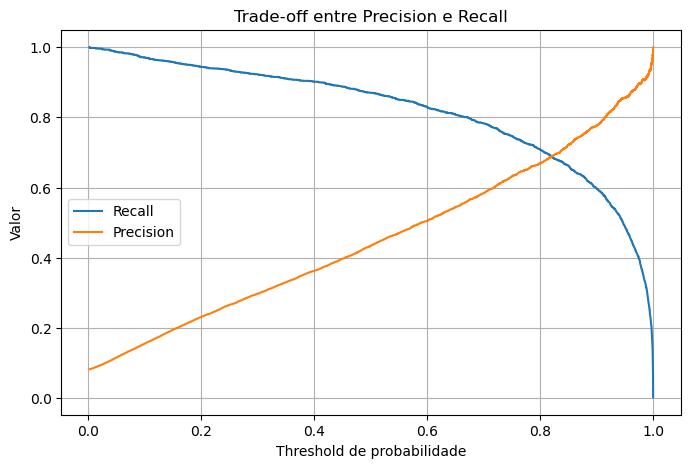

In [91]:
from sklearn.metrics import precision_recall_curve
import matplotlib.pyplot as plt

precision, recall, thresholds = precision_recall_curve(y_test, y_probability)

plt.figure(figsize=(8,5))
plt.plot(thresholds, recall[:-1], label='Recall')
plt.plot(thresholds, precision[:-1], label='Precision')
plt.xlabel("Threshold de probabilidade")
plt.ylabel("Valor")
plt.title("Trade-off entre Precision e Recall")
plt.legend()
plt.grid()
plt.show()


In [92]:
import numpy as np

# encontrar o threshold onde o recall seja acima de 0.9
for p, r, t in zip(precision, recall, thresholds):
    if t >= 0.3:
        print(f"Threshold: {round(t, 2)} | Recall: {round(r, 2)} | Precision: {round(p, 2)}")
        break


Threshold: 0.3 | Recall: 0.92 | Precision: 0.3


In [93]:
df_orders.groupby(df_orders['order_purchase_timestamp'].dt.to_period('D'))['order_id'].count().mean()

156.84700315457414

#### interpetração dos Resultados e Insights

Ambos os modelos apresentam um desempenho semelhante de forma geral, mas com diferenças importantes quando se analisa a cobertura dos atrasos. O primeiro modelo, por exemplo, tem uma cobertura mais baixa e acaba deixando passar muitos pedidos que, de fato, atrasam.

No período disponível para análise, há em média **157 pedidos por dia**, com uma taxa média de atraso de aproximadamente 8%, o que representa cerca de **13 pedidos atrasados por dia**.

Com o primeiro modelo, é possível identificar apenas parte desses pedidos. Estimo que cerca de **5 pedidos com risco de atraso deixariam de ser sinalizados diariamente**, o que limita a possibilidade de o time de logística agir de forma preventiva.

Já o segundo modelo aumenta essa cobertura para **87% dos pedidos que atrasam**, o que representa a identificação de aproximadamente **12 dos 13 pedidos com provável atraso por dia**. No entanto, essa melhora na cobertura vem acompanhada de uma queda na precisão, que fica abaixo de 45%. Isso significa que, junto dos pedidos realmente em risco, o modelo também alerta para pedidos que serão entregues dentro do prazo.

Com isso, o volume total de alertas por dia sobe para 27 pedidos, o que representa um aumento de 14 pedidos a mais sendo analisados por dia, em comparação com o primeiro modelo. Ainda assim, esse crescimento no esforço pode valer a pena, considerando que com ele é possível antecipar quase todos os atrasos e, com isso, **permitir ações corretivas que podem evitar problemas para o cliente final**.

Levando isso para periodos maiores o impacto é ainda maior sairia de **~150 atrasos mensais para ~30**, o que representa **uma redução de aproximadamente 80% nos atrasos não sinalizados**.

Esse tipo de atuação proativa tem potencial para **melhorar significativamente a experiência de compra, contribuindo para a satisfação e retenção dos clientes.**

Análise dos Fatores Associados ao Atraso
Além de avaliar os modelos, também analisei quais variáveis parecem estar mais presentes nos pedidos que atrasam. Ainda que eu não possa afirmar relações de causa e efeito, alguns padrões chamam atenção:


- tempo_entrega_dias: Quanto maior o tempo de entrega, maior a chance de atraso. Pode indicar distâncias longas, complexidade de entrega ou baixa prioridade.
- customer_state_SP: Entregas em SP têm maior chance de atraso, possivelmente por alto volume de pedidos ou gargalos logísticos.
- customer_state_RS: Entregas no RS têm menor chance de atraso — possivelmente rota mais direta ou estrutura de entrega mais eficiente.
- seller_state_SP, seller_state_RJ: Onde está o vendedor impacta o tempo de entrega. SP e RJ indicam maior risco, talvez por sobrecarga de remessas.
- product_category_name: Algumas categorias, como ferramentas/jardim, relógios/presentes e informática/acessórios, apresentam menor chance de atraso, segundo o modelo. 
- freight_value: Quanto maior o valor do frete, menor a chance de atraso segundo o modelo. Isso pode indicar que entregas caras estão associadas a fretes expressos ou mais organizados.

In [94]:
valor_inicial = 150
valor_final = 30

reducao = valor_inicial - valor_final
reducao_percentual = (reducao / valor_inicial) * 100

print(f"Redução: {reducao} atrasos")
print(f"Redução percentual: {reducao_percentual:.2f}%")

Redução: 120 atrasos
Redução percentual: 80.00%


#### 3. Segmentação de Clientes: Utilize técnicas de clustering para segmentar os clientes em grupos. Analise o comportamento de cada grupo e sugira estratégias de marketing específicas para cada um.

In [95]:
query_cluster = """
SELECT
    c.customer_unique_id,
    o.order_id,    
    op.payment_type,
    DATE_DIFF('day', o.order_purchase_timestamp, o.order_delivered_customer_date) AS tempo_entrega_dias,
    op.payment_sequential,
    op.payment_installments,
    op.payment_value,
    oi.price,
    oi.freight_value,
    r.review_score,
    p.product_category_name
FROM customers c
JOIN orders o ON c.customer_id = o.customer_id
LEFT JOIN order_payments op ON o.order_id = op.order_id
LEFT JOIN order_reviews r ON o.order_id = r.order_id
LEFT JOIN order_items oi ON o.order_id = oi.order_id
LEFT JOIN products p ON oi.product_id = p.product_id
WHERE o.order_status = 'delivered'
"""

# Executar a query no DuckDB
df_cluster_base = duckdb.query(query_cluster).to_df()

In [96]:
df_cluster_base = df_cluster_base.drop_duplicates()

In [97]:
df_cluster_base.isna().sum()

customer_unique_id         0
order_id                   0
payment_type               1
tempo_entrega_dias         8
payment_sequential         1
payment_installments       1
payment_value              1
price                      0
freight_value              0
review_score             710
product_category_name      0
dtype: int64

In [98]:
df_cluster_base[df_cluster_base.isna().any(axis=1)]

,customer_unique_id,order_id,payment_type,tempo_entrega_dias,payment_sequential,payment_installments,payment_value,price,freight_value,review_score,product_category_name
534,cce5e8188bf42ffb3bb5b18ff58f5965,ab7c89dc1bf4a1ead9d6ec1ec8968a84,credit_card,NaN,1.0,5.0,120.12,110.99,9.13,1.0,informatica_acessorios
1641,a5383a6d51465659e9153a2a6045e3b1,5394217c78ea24ee2b377c043b6bd7d9,credit_card,2.0,1.0,10.0,686.10,658.90,27.20,NaN,esporte_lazer
1642,7ea4287d46aa89fa09420147733356ab,26e91b596719ec194aaac895f6d2554b,credit_card,43.0,1.0,1.0,291.37,265.00,26.37,NaN,pet_shop
1643,87f1dc7fce7a8e113fc85b115ab30615,441e21387d52f5f2e85249669881fc79,credit_card,6.0,1.0,10.0,225.12,209.90,15.22,NaN,cama_mesa_banho
1644,b525fc8cce07342fb00ab3b2667c8eb9,71c0d1686c9b5556355dc29a0f5cf8dd,credit_card,16.0,1.0,1.0,98.20,32.99,16.11,NaN,moveis_decoracao
...,...,...,...,...,...,...,...,...,...,...,...
115557,c0be0cb64640de5fe50b0b238339db96,dc5ba59adf78a3c3f5707f5bc83ca234,credit_card,23.0,2.0,2.0,49.78,37.90,11.88,NaN,beleza_saude
115559,a40096fc0a3862e9e12bc55b5f8e6ab2,aec47b9987c836ffee2d7664b0929ec1,credit_card,10.0,1.0,1.0,91.70,39.90,14.57,NaN,outros
115607,8bba5d98eef0fba5bc4118a9e3b0cd89,8595563cdfdd7b6274ba3dfef7ab6ed8,boleto,6.0,1.0,1.0,310.08,89.90,2.41,NaN,cama_mesa_banho
115658,a40096fc0a3862e9e12bc55b5f8e6ab2,aec47b9987c836ffee2d7664b0929ec1,credit_card,10.0,1.0,1.0,91.70,16.90,1.68,NaN,cama_mesa_banho


In [99]:
top5_categories = df_cluster_base['product_category_name'].value_counts().nlargest(5).index.tolist()
df_cluster_base['top_category'] = df_cluster_base['product_category_name'].apply(
    lambda x: x if x in top5_categories else 'outros'
)


df_cluster_base['payment_type_grouped'] = df_cluster_base['payment_type'].apply(
    lambda x: 'credit_card' if x == 'credit_card' else 'others'
)

In [100]:
n_produtos = df_cluster_base.groupby('order_id').size().reset_index(name='n_products')
df_cluster_base = df_cluster_base.merge(n_produtos, on='order_id', how='left')

In [101]:
df_cluster_base = pd.get_dummies(df_cluster_base,
                               columns=['top_category'
                                        ]
                                )

In [102]:
linha = df_cluster_base.iloc[103472]
price = linha['price']
freight_value = linha['freight_value']

# Calcular a soma
valor_total = price + freight_value
print(valor_total)

76.65


In [103]:
df_cluster_base["review_score"] = df_cluster_base["review_score"].fillna(4)
df_cluster_base = df_cluster_base.dropna()

In [104]:
df_cluster_base.columns

Index(['customer_unique_id', 'order_id', 'payment_type', 'tempo_entrega_dias',
       'payment_sequential', 'payment_installments', 'payment_value', 'price',
       'freight_value', 'review_score', 'product_category_name',
       'payment_type_grouped', 'n_products', 'top_category_beleza_saude',
       'top_category_cama_mesa_banho', 'top_category_esporte_lazer',
       'top_category_informatica_acessorios', 'top_category_moveis_decoracao',
       'top_category_outros'],
      dtype='object')

In [105]:
df_grouped = df_cluster_base.groupby('customer_unique_id').agg({  
    'tempo_entrega_dias': 'median',
    'payment_value': 'sum',
    'payment_sequential':'max',
    'payment_installments': 'median',
    'price': 'sum',
    'freight_value': 'sum',
    'review_score': 'median',
    'n_products': 'median'      
}).reset_index()

In [106]:
features = [
    'tempo_entrega_dias',
    'payment_value',
    'payment_sequential',    
    'payment_installments',
    'price',
    'freight_value',
    'review_score',
    'n_products'    
]

X = df_grouped[features]

# Padronização
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

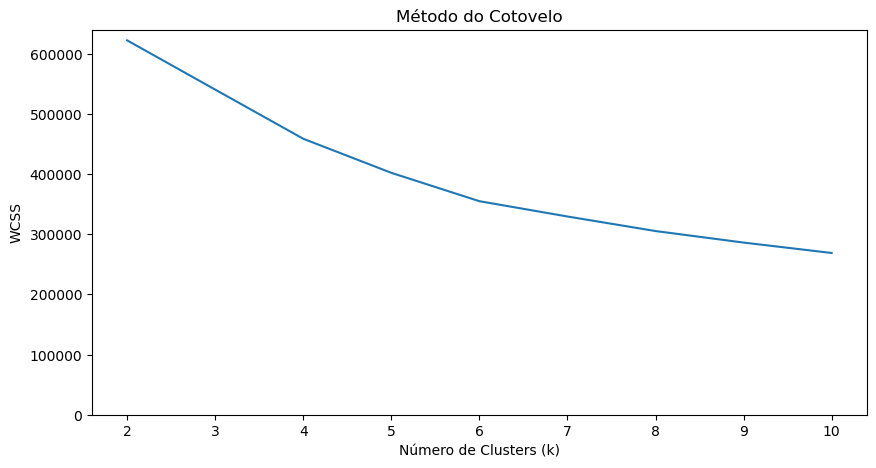

In [107]:
from sklearn.cluster import KMeans
wcss = []
for k in range(2, 11):
    kmeans = KMeans(n_clusters=k, random_state=42, n_init=10)
    kmeans.fit(X_scaled)
    wcss.append(kmeans.inertia_)

# Plot do método do cotovelo
plt.figure(figsize=(10, 5))
sns.lineplot(x=range(2, 11), y=wcss)
plt.title('Método do Cotovelo')
plt.xlabel('Número de Clusters (k)')
plt.ylabel('WCSS')
plt.xticks(range(2, 11))
plt.ylim(bottom=0)
plt.show()

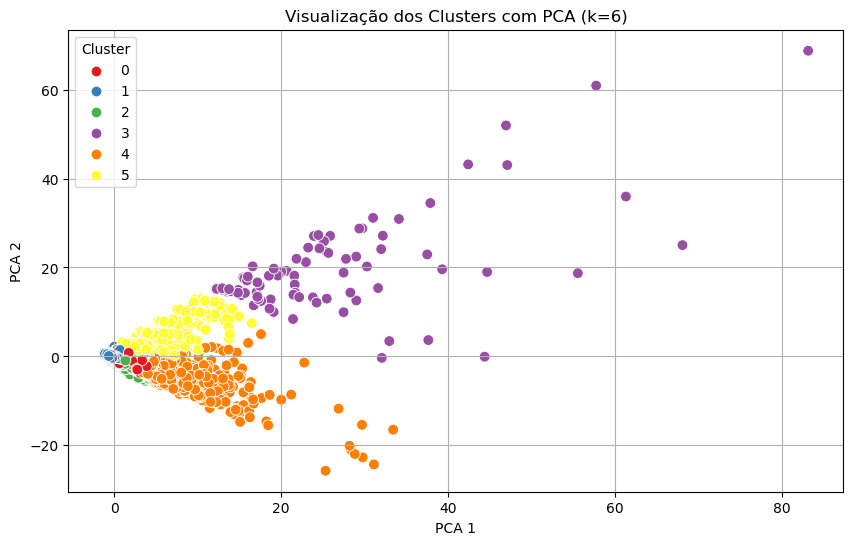

In [108]:
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
import seaborn as sns
import matplotlib.pyplot as plt

# Aplicando KMeans com k=6
kmeans = KMeans(n_clusters=6, random_state=42, n_init=10)
df_grouped['cluster'] = kmeans.fit_predict(X_scaled)

# Reduzindo para 2 dimensões para visualização
pca = PCA(n_components=2)
X_pca = pca.fit_transform(X_scaled)
df_grouped['pca1'] = X_pca[:, 0]
df_grouped['pca2'] = X_pca[:, 1]

# Plot dos clusters
plt.figure(figsize=(10, 6))
sns.scatterplot(data=df_grouped, x='pca1', y='pca2', hue='cluster', palette='Set1', s=60)
plt.title('Visualização dos Clusters com PCA (k=6)')
plt.xlabel('PCA 1')
plt.ylabel('PCA 2')
plt.legend(title='Cluster')
plt.grid(True)
plt.show()


In [109]:
df_grouped.shape

(93349, 12)

In [110]:
df_grouped[df_grouped['cluster']==4]

,customer_unique_id,tempo_entrega_dias,payment_value,payment_sequential,payment_installments,price,freight_value,review_score,n_products,cluster,pca1,pca2
124,004df63539fd5e38d4b0a0506de7549c,10.0,993.55,1.0,10.0,949.99,43.56,3.0,1.0,4,3.886998,-3.803141
130,005226be8d5b972d0f72b4e8a79f322b,6.0,1600.51,1.0,10.0,1561.00,39.51,5.0,1.0,4,5.921931,-5.565222
146,005f060d4223956c62b64e9567a36f0f,15.0,777.68,1.0,8.0,689.00,88.68,3.0,1.0,4,3.888214,-2.759912
184,0077dc76aaf02323f03bce9b00878253,31.0,874.42,1.0,6.0,849.50,24.92,5.0,1.0,4,2.903121,-3.032447
256,00adeda9b742746c0c66e10d00ea1b74,7.0,4296.80,1.0,10.0,2078.50,69.90,1.0,2.0,4,13.201695,-10.173559
...,...,...,...,...,...,...,...,...,...,...,...,...
93188,ff8eddc3ff272a5724e2ac6635cb7df2,9.0,1983.48,1.0,8.0,926.00,65.74,3.0,2.0,4,6.706002,-4.108614
93254,ffba9f9dff87b05e310ecc46c8591044,15.0,1626.83,1.0,5.0,1591.20,35.63,5.0,1.0,4,5.695934,-5.039487
93302,ffdffea8a4b04f14987bfef2a2287fa9,5.0,905.76,1.0,6.0,887.00,18.76,5.0,1.0,4,2.648418,-2.810466
93337,fff5eb4918b2bf4b2da476788d42051c,14.0,2844.96,1.0,1.0,175.00,299.16,5.0,1.0,4,10.192089,-4.130910


In [111]:
# Primeiro, remove duplicatas por pedido para garantir 1 linha por order_id
df_pedidos_unicos = df_cluster_base.drop_duplicates(subset='order_id')

# Agora agrupa por customer_unique_id
df_final = df_pedidos_unicos.groupby('customer_unique_id').agg({
    'order_id': 'count',
    'payment_installments': 'median',
    'payment_sequential': 'median',
    'tempo_entrega_dias': 'median',
    'payment_value': 'sum',
    'price': 'sum',
    'freight_value': 'sum',
    'review_score': 'median',    
    'product_category_name': lambda x: x.mode()[0] if not x.mode().empty else None  # categoria mais comum
}).reset_index()

# Define se é recompra
df_final['is_recompra'] = df_final['order_id'].apply(lambda x: 1 if x > 1 else 0)

# Taxa de recompra
taxa_recompra = df_final['is_recompra'].mean()

print(f"Taxa de recompra: {taxa_recompra:.2%}")


Taxa de recompra: 3.00%


In [112]:
df_merged = df_final.merge(df_grouped[['customer_unique_id','cluster']], on='customer_unique_id', how='left')

# Verifica se o número de linhas se manteve
assert len(df_merged) == len(df_final), "O número de registros mudou após o merge!"

In [113]:
def get_mean_insights(df,column,n):
    mean = df.loc[df['cluster']==n,column].mean()
    return round(mean,0)

def get_sum_insights(df,column,n):
    soma = df.loc[df['cluster']==n,column].sum()
    return round(soma,0)

colunas = ['tempo_entrega_dias','payment_value','payment_sequential','payment_installments','price','freight_value','review_score']
clusters = [cluster for cluster in range(0,6)]

for coluna in colunas:
    print(coluna.upper())
    for cluster in clusters:
        print(f"cluster = {cluster}, média = {get_mean_insights(df_merged,coluna,cluster)}")
         
            
        
        

TEMPO_ENTREGA_DIAS
cluster = 0, média = 23.0
cluster = 1, média = 10.0
cluster = 2, média = 12.0
cluster = 3, média = 14.0
cluster = 4, média = 15.0
cluster = 5, média = 12.0
PAYMENT_VALUE
cluster = 0, média = 148.0
cluster = 1, média = 112.0
cluster = 2, média = 258.0
cluster = 3, média = 31.0
cluster = 4, média = 1229.0
cluster = 5, média = 75.0
PAYMENT_SEQUENTIAL
cluster = 0, média = 1.0
cluster = 1, média = 1.0
cluster = 2, média = 1.0
cluster = 3, média = 5.0
cluster = 4, média = 1.0
cluster = 5, média = 2.0
PAYMENT_INSTALLMENTS
cluster = 0, média = 3.0
cluster = 1, média = 2.0
cluster = 2, média = 7.0
cluster = 3, média = 1.0
cluster = 4, média = 6.0
cluster = 5, média = 2.0
PRICE
cluster = 0, média = 106.0
cluster = 1, média = 87.0
cluster = 2, média = 208.0
cluster = 3, média = 188.0
cluster = 4, média = 1044.0
cluster = 5, média = 100.0
FREIGHT_VALUE
cluster = 0, média = 21.0
cluster = 1, média = 18.0
cluster = 2, média = 27.0
cluster = 3, média = 29.0
cluster = 4, média = 65.

In [114]:
colunas_precos = ['payment_value','price','freight_value']
for coluna in colunas_precos:
    print(coluna.upper())
    for cluster in clusters:
        print(f"cluster = {cluster}, soma = {get_sum_insights(df_merged,coluna,cluster)}") 

PAYMENT_VALUE
cluster = 0, soma = 1992707.0
cluster = 1, soma = 6671487.0
cluster = 2, soma = 3958939.0
cluster = 3, soma = 2652.0
cluster = 4, soma = 2332987.0
cluster = 5, soma = 207319.0
PRICE
cluster = 0, soma = 1429681.0
cluster = 1, soma = 5179592.0
cluster = 2, soma = 3192694.0
cluster = 3, soma = 16193.0
cluster = 4, soma = 1981691.0
cluster = 5, soma = 277564.0
FREIGHT_VALUE
cluster = 0, soma = 288852.0
cluster = 1, soma = 1057169.0
cluster = 2, soma = 412467.0
cluster = 3, soma = 2479.0
cluster = 4, soma = 124016.0
cluster = 5, soma = 57643.0


In [115]:
df_merged.groupby('cluster')['is_recompra'].mean()

cluster
0    0.022903
1    0.022702
2    0.049504
3    0.081395
4    0.103212
5    0.062545
Name: is_recompra, dtype: float64

### **Análise dos Grupos de Clientes**

**Grupo 0 = Insatisfeitos:**  
Clientes mais insatisfeitos, com a menor taxa de recorrência entre todos os grupos. Possuem o maior tempo de entrega, o que pode estar impactando negativamente na experiência e na fidelização. É provável que enfrentem muitos atrasos na entrega. Vale atenção especial para a logística desse grupo.

**Grupo 1 = Compra Única:**  
É o maior grupo em número de clientes, caracterizado por compras únicas. Apesar disso, são os mais satisfeitos e possuem o menor tempo de entrega. Curiosamente, também são os que mais gastam no total. Vale um investimento maior nesse grupo, pois há potencial para aumentar a recorrência.

**Grupo 2 = Parceladores/Compradores:**  
Segundo grupo que mais gasta (atrás apenas do grupo 4) e o que mais parcela as compras. Também apresenta uma boa taxa de recorrência. Indica um perfil de cliente que responde bem a políticas de crédito.

**Grupo 3 = Poucos e Fiéis:**  
Menor grupo em número de clientes, mas com alta taxa de recorrência — acima da média geral. Não utilizam parcelamento, o que sugere um cliente fidelizado e engajado.

**Grupo 4 = Premium:**  
Grupo mais valioso: é o que mais gasta em média, possui a maior taxa de recorrência e também utiliza o parcelamento. Merece atenção especial em estratégias de retenção e fidelização.

**Grupo 5 = Emergentes:**  
Faz parte da “trinca” de grupos com boa taxa de recorrência (junto com os grupos 3 e 4). Embora menor, esse grupo demonstra comportamento de fidelização relevante.

---

### **Insights Gerais:**

- O **parcelamento** parece ter impacto direto na **recorrência** e no **volume gasto**. Vale investir em políticas de crédito que incentivem esse comportamento.
- O **tempo de entrega** é um fator crítico: atrasos podem afetar tanto a **satisfação** quanto a **recorrência**.
- Investimentos em **marketing e retenção** devem ser direcionados especialmente para as categorias que retêm acima da média, como:
  - **Eletrodomésticos**
  - **Fashion - Bolsas e Acessórios**
  - **Cama, Mesa e Banho**
- **Grupos 4 e 2** merecem atenção especial por combinarem alta taxa de retenção com alto volume de gasto.
- **Grupos 3 e 5**, apesar de menores, apresentam alta fidelização e podem ser explorados com ações mais segmentadas.
- O **Grupo 0** precisa de atenção operacional, principalmente quanto à **logística de entrega**, que impacta diretamente na satisfação.


In [116]:
df_final[df_final['is_recompra']==1]

,customer_unique_id,order_id,payment_installments,payment_sequential,tempo_entrega_dias,payment_value,price,freight_value,review_score,product_category_name,is_recompra
104,004288347e5e88a27ded2bb23747066c,2,2.0,1.0,6.5,354.37,317.89,36.48,5.0,cool_stuff,1
243,00a39521eb40f7012db50455bf083460,2,1.0,1.0,17.5,123.25,81.45,41.80,4.0,eletronicos,1
305,00cc12a6d8b578b8ebd21ea4e2ae8b27,2,1.0,1.0,6.5,126.20,99.80,26.40,3.0,cama_mesa_banho,1
404,011575986092c30523ecb71ff10cb473,2,1.5,1.0,13.5,214.90,182.90,32.00,3.5,brinquedos,1
419,011b4adcd54683b480c4d841250a987f,2,8.0,1.0,12.5,236.30,126.46,34.90,4.5,alimentos,1
...,...,...,...,...,...,...,...,...,...,...,...
92982,ff03923ad1eb9e32304deb7f9b2a45c9,2,1.5,1.0,7.5,247.06,220.64,26.42,3.0,beleza_saude,1
93076,ff44401d0d8f5b9c54a47374eb48c1b8,2,1.0,1.0,12.5,1.25,39.80,28.20,3.0,fashion_bolsas_e_acessorios,1
93178,ff8892f7c26aa0446da53d01b18df463,2,8.0,1.0,37.0,330.14,277.95,52.19,3.0,cama_mesa_banho,1
93196,ff922bdd6bafcdf99cb90d7f39cea5b3,3,2.0,1.0,14.0,139.60,94.79,44.81,5.0,cama_mesa_banho,1


In [117]:
def calcular_iv(df, feature, target, bins=10):
   
    df_temp = df[[feature, target]].copy()
    
    # Se for numérica, aplicar binning
    if pd.api.types.is_numeric_dtype(df_temp[feature]):
        df_temp[feature] = pd.qcut(df_temp[feature], q=bins, duplicates='drop')
    
    # Agrupar e contar
    grouped = df_temp.groupby(feature)[target].agg(['count', 'sum'])
    grouped = grouped.rename(columns={'count': 'total', 'sum': 'clientes_retidos'})
    grouped['clientes_nao_retidos'] = grouped['total'] - grouped['clientes_retidos']
    grouped['taxa_retencao_categoria'] = grouped['clientes_retidos'] / grouped['total']
    
    
    # Proporções
    grouped['prop_clientes_nao_retidos'] = grouped['clientes_nao_retidos'] / grouped['clientes_nao_retidos'].sum()
    grouped['prop_clientes_retidos'] = grouped['clientes_retidos'] / grouped['clientes_retidos'].sum()
    
    # IV por grupo
    grouped['woe'] = np.log((grouped['prop_clientes_retidos']+ 1e-6) / (grouped['prop_clientes_nao_retidos'] + 1e-6))
    grouped['iv'] = (grouped['prop_clientes_retidos'] - grouped['prop_clientes_nao_retidos']) * grouped['woe']    
    
    return grouped

In [118]:
iv_parcela= calcular_iv(df_final,'payment_installments','is_recompra')

iv_parcela.sort_values("taxa_retencao_categoria", ascending=False)

,total,clientes_retidos,clientes_nao_retidos,taxa_retencao_categoria,prop_clientes_nao_retidos,prop_clientes_retidos,woe,iv
payment_installments,,,,,,,,
"(5.0, 8.0]",9163,453,8710,0.049438,0.096192,0.161728,0.519564,0.034050
"(3.0, 5.0]",11559,453,11106,0.039190,0.122653,0.161728,0.276553,0.010806
"(1.0, 2.0]",11681,386,11295,0.033045,0.124740,0.137808,0.099625,0.001302
"(2.0, 3.0]",9749,321,9428,0.032926,0.104122,0.114602,0.095905,0.001005
"(8.0, 24.0]",5667,162,5505,0.028587,0.060796,0.057836,-0.049911,0.000148
"(-0.001, 1.0]",45530,1026,44504,0.022535,0.491496,0.366298,-0.294007,0.036809


In [119]:
iv_parcela['iv'].sum()

0.08412028312454486

In [120]:
iv_produto = calcular_iv(df_final,'product_category_name','is_recompra')

iv_produto[iv_produto['total']>500].sort_values("taxa_retencao_categoria", ascending=False).head(10)

,total,clientes_retidos,clientes_nao_retidos,taxa_retencao_categoria,prop_clientes_nao_retidos,prop_clientes_retidos,woe,iv
product_category_name,,,,,,,,
eletrodomesticos,676,60,616,0.088757,0.006803,0.021421,1.146901,0.016765
fashion_bolsas_e_acessorios,1699,102,1597,0.060035,0.017637,0.036416,0.724965,0.013614
cama_mesa_banho,8851,503,8348,0.056830,0.092194,0.179579,0.666711,0.058260
esporte_lazer,7209,284,6925,0.039395,0.076479,0.101392,0.281981,0.007025
bebes,2733,104,2629,0.038053,0.029034,0.037130,0.245928,0.001991
beleza_saude,8444,310,8134,0.036712,0.089831,0.110675,0.208666,0.004349
brinquedos,3719,131,3588,0.035225,0.039625,0.046769,0.165747,0.001184
construcao_ferramentas_construcao,718,25,693,0.034819,0.007653,0.008925,0.153731,0.000196
moveis_decoracao,5829,192,5637,0.032939,0.062254,0.068547,0.096290,0.000606


In [121]:
iv_produto['iv'].sum()

0.3030913277485936

In [122]:
iv_entrega = calcular_iv(df_final,'tempo_entrega_dias','is_recompra')

iv_entrega.sort_values("taxa_retencao_categoria", ascending=False).head(10)

,total,clientes_retidos,clientes_nao_retidos,taxa_retencao_categoria,prop_clientes_nao_retidos,prop_clientes_retidos,woe,iv
tempo_entrega_dias,,,,,,,,
"(10.0, 12.0]",9923,377,9546,0.037993,0.105425,0.134595,0.244269,0.007125
"(12.0, 14.0]",8361,317,8044,0.037914,0.088837,0.113174,0.242121,0.005893
"(14.0, 17.0]",8364,301,8063,0.035988,0.089047,0.107462,0.187971,0.003461
"(9.0, 10.0]",5626,188,5438,0.033416,0.060057,0.067119,0.111177,0.000785
"(17.0, 23.0]",9722,308,9414,0.031681,0.103967,0.109961,0.056050,0.000336
"(7.0, 9.0]",12971,398,12573,0.030684,0.138855,0.142092,0.023049,0.000075
"(4.0, 6.0]",11333,319,11014,0.028148,0.121637,0.113888,-0.065827,0.000510
"(6.0, 7.0]",7257,199,7058,0.027422,0.077948,0.071046,-0.092707,0.000640
"(23.0, 210.0]",8845,205,8640,0.023177,0.095419,0.073188,-0.265241,0.005897


In [123]:
iv_entrega['iv'].sum()

0.053763644980564046

###### Os IVs auxiliaram na análise do cluster e de retenção que eu condensei acima

#### 4. Análise de Satisfação: Explore a relação entre a nota de avaliação dos clientes e diferentes aspectos como categoria do produto, tempo de entrega, valor do pedido, etc. Identifique fatores que mais impactam na satisfação do cliente.

In [124]:
query_satisfacao = """
SELECT
    c.customer_unique_id,
    o.order_id,    
    op.payment_type,
    DATE_DIFF('day', o.order_purchase_timestamp, o.order_delivered_customer_date) AS tempo_entrega_dias,
    op.payment_sequential,
    op.payment_installments,
    op.payment_value,
    oi.price,
    oi.freight_value,
    r.review_score,
    p.product_category_name
FROM customers c
JOIN orders o ON c.customer_id = o.customer_id
LEFT JOIN order_payments op ON o.order_id = op.order_id
LEFT JOIN order_reviews r ON o.order_id = r.order_id
LEFT JOIN order_items oi ON o.order_id = oi.order_id
LEFT JOIN products p ON oi.product_id = p.product_id
WHERE o.order_status = 'delivered' 
"""

# Executar a query no DuckDB
df_satisfacao = duckdb.query(query_satisfacao).to_df()

In [125]:
df_satisfacao = df_satisfacao.drop_duplicates(subset='order_id')
df_satisfacao["review_score"] = df_satisfacao["review_score"].fillna(4)
df_satisfacao = df_satisfacao.dropna()

In [126]:
df_satisfacao.columns

Index(['customer_unique_id', 'order_id', 'payment_type', 'tempo_entrega_dias',
       'payment_sequential', 'payment_installments', 'payment_value', 'price',
       'freight_value', 'review_score', 'product_category_name'],
      dtype='object')

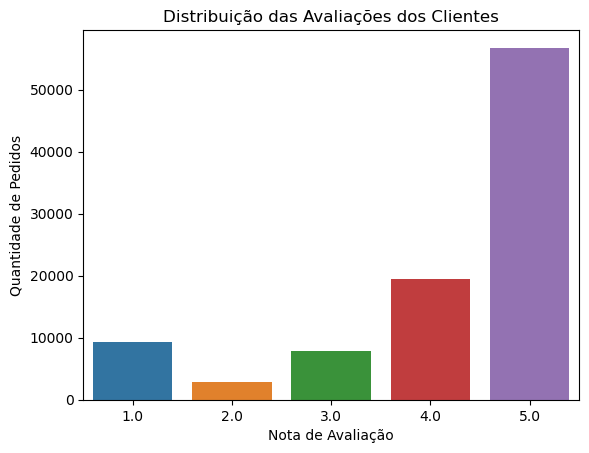

In [127]:
sns.countplot(data=df_satisfacao, x='review_score')
plt.title('Distribuição das Avaliações dos Clientes')
plt.xlabel('Nota de Avaliação')
plt.ylabel('Quantidade de Pedidos')
plt.show()


In [128]:
df_satisfacao['review_score'].mean()

4.155023893686055

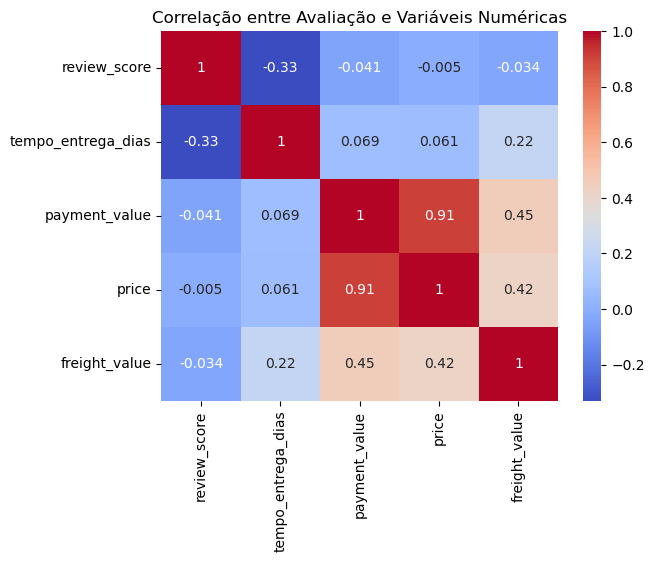

In [129]:
df_corr = df_satisfacao[['review_score', 'tempo_entrega_dias', 'payment_value', 'price', 'freight_value']]

# Correlação de Pearson
correlation = df_corr.corr()
sns.heatmap(correlation, annot=True, cmap='coolwarm')
plt.title('Correlação entre Avaliação e Variáveis Numéricas')
plt.show()


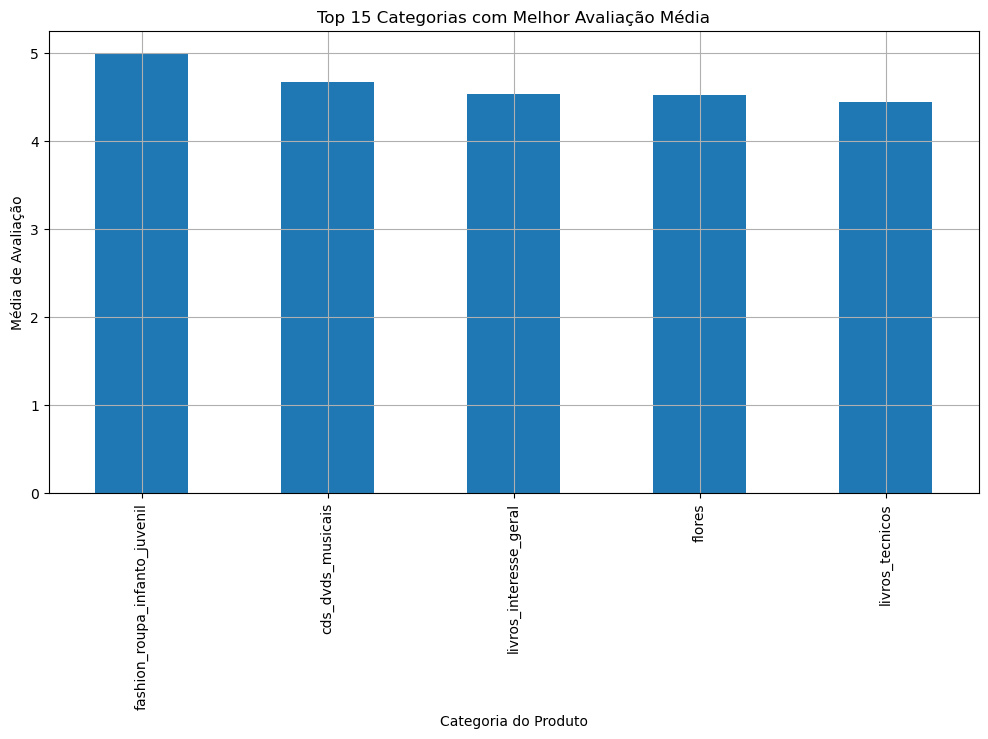

In [130]:
cat_review = df_satisfacao.groupby('product_category_name')['review_score'].mean().sort_values(ascending=False)

plt.figure(figsize=(12, 6))
cat_review.head(5).plot(kind='bar')
plt.title('Top 15 Categorias com Melhor Avaliação Média')
plt.xlabel('Categoria do Produto')
plt.ylabel('Média de Avaliação')
plt.xticks(rotation=90)
plt.grid(True)
plt.show()


#### Análise de Correlação da Satisfação dos Clientes - Insights

Tempo de entrega é o principal fator ligado à satisfação do cliente, com correlação negativa moderada de -0.33. Isso indica que entregas mais lentas tendem a gerar avaliações piores.

Valor pago, preço do produto e valor do frete têm correlação quase nula com a satisfação, o que sugere que os clientes não penalizam a empresa com base no preço ou pagamento, mas sim no serviço logístico.

## 4. Visualização e Dashboards

In [131]:
# Tabela principal consolidada
query_dash_vendas = """
SELECT 
    o.order_id,
    o.order_purchase_timestamp::DATE AS data_pedido,
    c.customer_state,
    pt.product_category_name,
    oi.price,
    oi.freight_value,
    orw.review_score,
    DATEDIFF('day', o.order_purchase_timestamp, o.order_delivered_customer_date) AS tempo_entrega_dias,
    CONCAT(s.seller_zip_code_prefix, '-', s.seller_city, '-', s.seller_state) AS nome_vendedor
FROM orders o
JOIN customers c ON o.customer_id = c.customer_id
JOIN order_items oi ON o.order_id = oi.order_id
JOIN products pt ON oi.product_id = pt.product_id
JOIN order_reviews orw ON o.order_id = orw.order_id
JOIN sellers s ON oi.seller_id = s.seller_id
WHERE o.order_status = 'delivered'
"""

df_vendas = duckdb.query(query_dash_vendas).to_df()


In [132]:
from ipywidgets import interact, widgets
import plotly.express as px

@interact
def vendas_por_tempo(estado=widgets.Dropdown(options=['Todos'] + sorted(df_vendas['customer_state'].unique())),
                     produto=widgets.Dropdown(options=['Todos'] + sorted(df_vendas['product_category_name'].dropna().unique()))):

    df = df_vendas.copy()
    if estado != 'Todos':
        df = df[df['customer_state'] == estado]
    if produto != 'Todos':
        df = df[df['product_category_name'] == produto]

    df['total_price'] = df['price'] + df['freight_value']
    vendas = df.groupby('data_pedido').agg({'total_price': 'sum'}).reset_index()
    fig = px.line(vendas, x='data_pedido', y='total_price', title='Evolução das Vendas ao Longo do Tempo')
    fig.update_layout(yaxis_title='Valor Total de Vendas (R$)', xaxis_title='Data do Pedido')
    fig.show()


interactive(children=(Dropdown(description='estado', options=('Todos', 'AC', 'AL', 'AM', 'AP', 'BA', 'CE', 'DF…

Pico de vendas expressivo durante a Black Friday de 2017

In [133]:

import json
import requests

# Carregar GeoJSON dos estados do Brasil
url_geojson = 'https://raw.githubusercontent.com/codeforamerica/click_that_hood/master/public/data/brazil-states.geojson'
geojson_data = requests.get(url_geojson).json()

# Agrupar vendas por estado
mapa_vendas = df_vendas.groupby('customer_state').agg({'price': 'sum'}).reset_index()

# Visualização com choropleth
fig = px.choropleth(
    mapa_vendas,
    geojson=geojson_data,
    locations='customer_state',
    color='price',
    color_continuous_scale='YlOrRd',
    featureidkey='properties.sigla',  # depende da estrutura do GeoJSON, pode ser 'id' ou 'properties.sigla'
    scope='south america',
    title='Concentração de Vendas por Estado'
)

fig.update_geos(fitbounds="locations", visible=False)
fig.update_layout(margin={"r":0,"t":40,"l":0,"b":0})
fig.show()



**Concentração de Vendas no Sudeste**

São Paulo lidera com **vendas superiores a 5 milhões** (destacado em **vermelho escuro**), seguido por **Rio de Janeiro** e **Minas Gerais** (em **tons laranja**), com vendas entre **2-3 milhões**. 

O restante do Brasil apresenta **valores significativamente menores** (representados em **tons claros**), evidenciando a **forte centralização comercial na região Sudeste**.


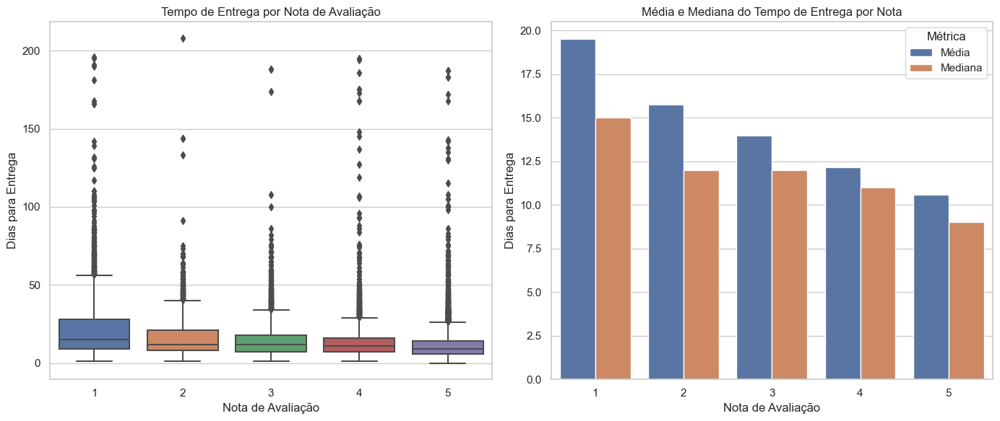

In [134]:


# Agrupar média e mediana por nota
media_mediana = df_vendas.groupby('review_score')['tempo_entrega_dias'].agg(['mean', 'median']).reset_index()
media_mediana.columns = ['review_score', 'Média', 'Mediana']
media_mediana = media_mediana.melt(id_vars='review_score', value_vars=['Média', 'Mediana'], var_name='Métrica', value_name='Valor')

# Criar a figura com dois gráficos lado a lado
sns.set(style="whitegrid")
fig, axes = plt.subplots(1, 2, figsize=(14, 6))

# Boxplot: Tempo de entrega por nota
sns.boxplot(data=df_vendas, x='review_score', y='tempo_entrega_dias', ax=axes[0])
axes[0].set_title('Tempo de Entrega por Nota de Avaliação')
axes[0].set_xlabel('Nota de Avaliação')
axes[0].set_ylabel('Dias para Entrega')

# Gráfico de barras: Média e Mediana do tempo de entrega por nota
sns.barplot(data=media_mediana, x='review_score', y='Valor', hue='Métrica', ax=axes[1])
axes[1].set_title('Média e Mediana do Tempo de Entrega por Nota')
axes[1].set_xlabel('Nota de Avaliação')
axes[1].set_ylabel('Dias para Entrega')

plt.tight_layout()
plt.show()


Melhor entrega com notas mais altas: o boxplot mostra claramente que produtos com avaliações de 4-5 estrelas têm tempos de entrega mais consistentes (menos dispersão) e geralmente mais rápidos. O gráfico de barras confirma esta tendência, com média e mediana de dias de entrega diminuindo progressivamente conforme as notas aumentam - produtos com nota 5 são entregues quase duas vezes mais rápido que produtos com nota 1.

In [135]:
import pandas as pd
import plotly.graph_objects as go
from plotly.subplots import make_subplots
from ipywidgets import interact, widgets
from IPython.display import display
import plotly.express as px

# === AGRUPAMENTO DOS DADOS ===
df_vendedor = df_vendas.groupby('nome_vendedor').agg({
    'price': 'sum',
    'review_score': ['mean', 'median'],
    'tempo_entrega_dias': ['mean', 'median'],
    'order_id': 'nunique'
}).reset_index()

# Renomeando colunas
df_vendedor.columns = ['nome_vendedor', 'total_vendido', 'media_avaliacao', 'mediana_avaliacao',
                       'media_entrega', 'mediana_entrega', 'quantidade_pedidos']

# === FUNÇÃO DE PLOTAGEM ===
def dashboard_vendedores(top_or_bottom='top', quantidade_vendedores=10):
    # Seleção dos dados
    if top_or_bottom == 'top':
        df_venda = df_vendedor.sort_values(by='total_vendido', ascending=False).head(quantidade_vendedores)
        df_tabela = df_vendedor.sort_values(
        by=['mediana_avaliacao', 'mediana_entrega'],
        ascending=[False, True]
    ).head(quantidade_vendedores)
    else:
        df_venda = df_vendedor.sort_values(by='total_vendido', ascending=True).head(quantidade_vendedores)
        df_tabela = df_vendedor.sort_values(
        by=['mediana_avaliacao', 'mediana_entrega'],
        ascending=[True, False]
    ).head(quantidade_vendedores)

    # Tabela combinando avaliação e tempo de entrega
    

    # Gráfico de barras (vendas)
    fig = go.Figure()
    fig.add_trace(go.Bar(
        x=df_venda['nome_vendedor'],
        y=df_venda['total_vendido'],
        name='Total Vendido',
        text=df_venda['total_vendido'].round(2),  # rótulo com 2 casas decimais
        textposition='outside',        
        marker_color='green'
    ))

    fig.update_layout(
        title=f"Total Vendido pelos {top_or_bottom.capitalize()} {quantidade_vendedores} Vendedores",
        xaxis_title="Vendedor",
        yaxis_title="Total Vendido (R$)",
        height=600,
        width=950,
    )

    fig.show()

    # Tabela com avaliação e entrega
    display(df_tabela[['nome_vendedor', 'mediana_avaliacao', 'mediana_entrega']].reset_index(drop=True))

# === INTERATIVIDADE ===
interact(
    dashboard_vendedores,
    top_or_bottom=widgets.ToggleButtons(
        options=['top', 'bottom'],
        description='Tipo:',
        button_style=''
    ),
    quantidade_vendedores=widgets.IntSlider(
        value=10, min=5, max=350, step=1, description='Quantidade:'
    )
)


interactive(children=(ToggleButtons(description='Tipo:', options=('top', 'bottom'), value='top'), IntSlider(va…

<function __main__.dashboard_vendedores(top_or_bottom='top', quantidade_vendedores=10)>